# Importing libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
import numpy as np
import sklearn
import seaborn as sns
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from math import log


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Importing datasets

In [ ]:
df_neg = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/datasets/Metabolomics_Negative.xlsx")

#Transpose
df_neg = df_neg.T

df_neg.columns = df_neg.iloc[1]  # Use name row as header
df_neg = df_neg.drop(index="Name")

# Utility extractions
mz_values_neg = df_neg.iloc[0].values

df_neg = df_neg.drop(index=["MEDIA QC","DEV.ST QC", "CV% QC"])
df_neg


In [ ]:
df_pos = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/datasets/Metabolomics_Positive.xlsx")

#Transpose
df_pos = df_pos.T

df_pos.columns = df_pos.iloc[1]  # Use name row as header
df_pos = df_pos.drop(index="Name")

# Utility extractions
mz_values_pos = df_pos.iloc[0].values

df_pos

# **Metabolomics negative - Preprocessing** 🍎

## Normalizations

### **Probabilistic Quotients Normalization**

This method is based on the calculation of a most probable dilution factor by looking at the distribution of the quotients of the amplitudes of a test spectrum by those of a reference spectrum.

In [ ]:
def PQN_normalization(df: pd.DataFrame,reference_sample = None)-> pd.DataFrame:
    df_norm = df.copy()
    if reference_sample is None:
      reference_sample = df_norm.iloc[1:].median(axis=0)

    for i in range(1, df_norm.shape[0]):
        df_norm.iloc[i] = df_norm.iloc[i]/((df_norm.iloc[i]/reference_sample).median())

    return df_norm,reference_sample

df_neg_pqn,_ = PQN_normalization(df_neg)
df_neg_pqn

### **TIC normalization**

For each feature in the sample, divide its intensity value by the sum of the intensities of all the features for that sample.

In [ ]:
def TIC_normalization(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  for i in df.index[1:]:
    sum = df.loc[i].sum()
    df.loc[i] = df.loc[i] / sum
  return df

df_neg_TIC_normalization = TIC_normalization(df_neg)
df_neg_TIC_normalization

### **Mean normalization**

In [ ]:
def mean_normalization(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  for i in df.index[1:]:
    mean = df.loc[i].mean()
    df.loc[i] = df.loc[i] / mean
  return df

df_neg_mean_normalization = mean_normalization(df_neg)
df_neg_mean_normalization

### **Max normalization**

In [ ]:
def max_normalization(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  for i in df.index[1:]:
    max = df.loc[i].max()
    df.loc[i] = df.loc[i] / max
  return df

df_neg_max_normalization = max_normalization(df_neg)
df_neg_max_normalization

### **Range normalization**

In [ ]:
def range_normalization(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  for i in df.index[1:]:
    range = df.loc[i].max() - df.loc[i].min()
    df.loc[i] = df.loc[i] / range
  return df

df_neg_range_normalization = range_normalization(df_neg)
df_neg_range_normalization

### **Median normalization**

In [ ]:
def median_normalization(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  for i in df.index[1:]:
    median = df.loc[i].median()
    df.loc[i] = df.loc[i] / median
  return df

df_neg_median_normalization = median_normalization(df_neg)
df_neg_median_normalization

## **PLOTS**

###Scatter plots

Useful scatter plots that are used to understand how different normalization processes affect - visually - the data. In order -> (1) PRE PQN and POST PQN intensity per group, then the same thing but only for the QC group. (2) PRE TIC and POST TIC intensity per group, then the same thing but only for the QC group.

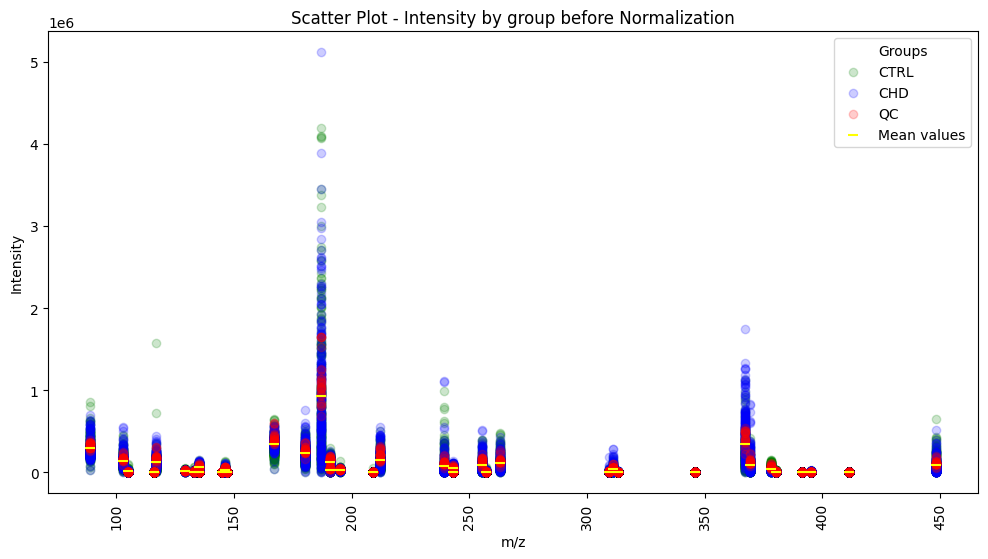

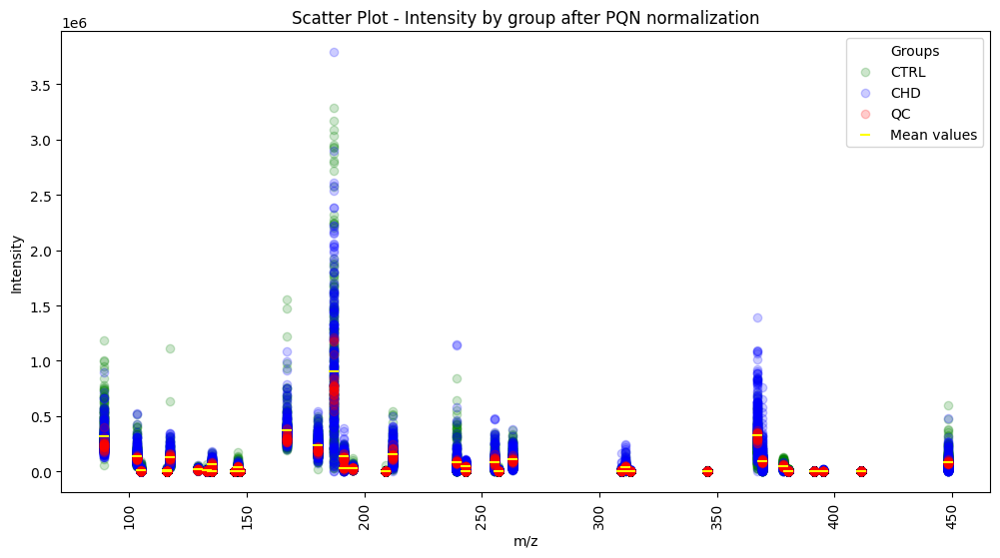

In [ ]:
''' PRE-NORMALIZATION SCATTER PLOT (1) '''
intensity_data = df_neg.iloc[1:, 0:]
sample_names = df_neg.index[1:].to_numpy()

# Extract labels from the rows
group_labels = pd.Series(sample_names).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))
colors = {'QC': 'red', 'CTRL': 'green', 'CHD': 'blue'} # blind friendly :)

for group in ['CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names[group_labels == group]
    group_data = intensity_data.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_neg, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_neg.iloc[1:].mean()
plt.scatter(mz_values_neg, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group before Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

''' POST-PQN NORMALIZATION SCATTER PLOT (1) '''
intensity_data2 = df_neg_pqn.iloc[1:, 0:]
sample_names2 = df_neg_pqn.index[1:].to_numpy()

# Extract labels from the rows
group_labels2 = pd.Series(sample_names2).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))

for group in [ 'CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names2[group_labels2 == group]
    group_data = intensity_data2.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_neg, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_neg_pqn.iloc[1:].mean()
plt.scatter(mz_values_neg, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group after PQN normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()


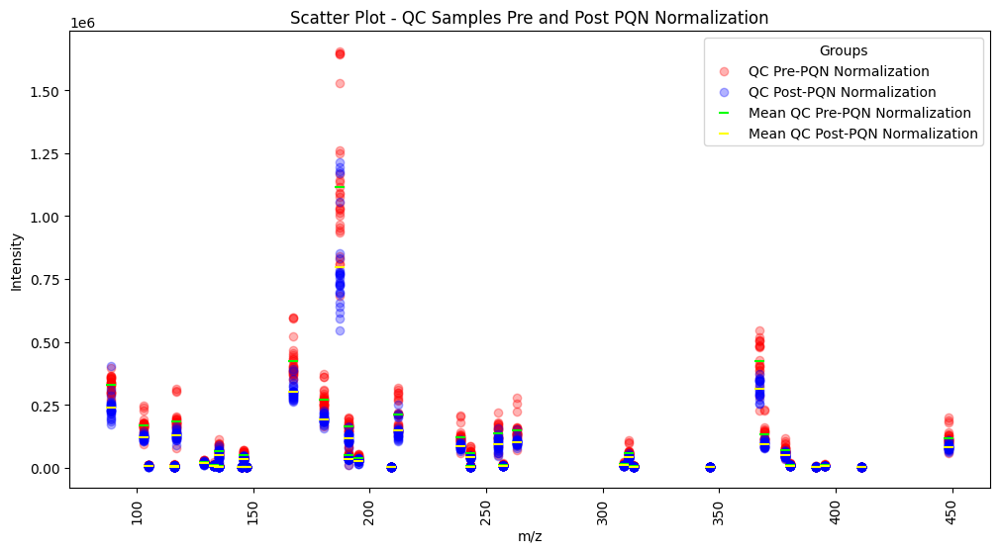

In [ ]:
''' SCATTER PLOT ONLY QC (1)'''
# Pre-PQN normalization
qc_samples_pre = sample_names[group_labels == 'QC']
qc_data_pre = intensity_data.loc[qc_samples_pre]

# Post-PQN normalization
qc_samples_post = sample_names2[group_labels2 == 'QC']
qc_data_post = intensity_data2.loc[qc_samples_post]

plt.figure(figsize=(12, 6))

# Scatter plot QC pre-normalization
for sample in qc_data_pre.index:
    plt.scatter(mz_values_neg, qc_data_pre.loc[sample], alpha=0.3, color='red', label='QC Pre-PQN Normalization' if sample == qc_data_pre.index[0] else "")

# Scatter plot QC post-normalization
for sample in qc_data_post.index:
    plt.scatter(mz_values_neg, qc_data_post.loc[sample], alpha=0.3, color='blue', label='QC Post-PQN Normalization' if sample == qc_data_post.index[0] else "")

# means
mean_qc_pre = qc_data_pre.mean()
mean_qc_post = qc_data_post.mean()
plt.scatter(mz_values_neg, mean_qc_pre.values, color='lime', label='Mean QC Pre-PQN Normalization', s=50, marker='_')
plt.scatter(mz_values_neg, mean_qc_post.values, color='yellow', label='Mean QC Post-PQN Normalization', s=50, marker='_')

plt.title("Scatter Plot - QC Samples Pre and Post PQN Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

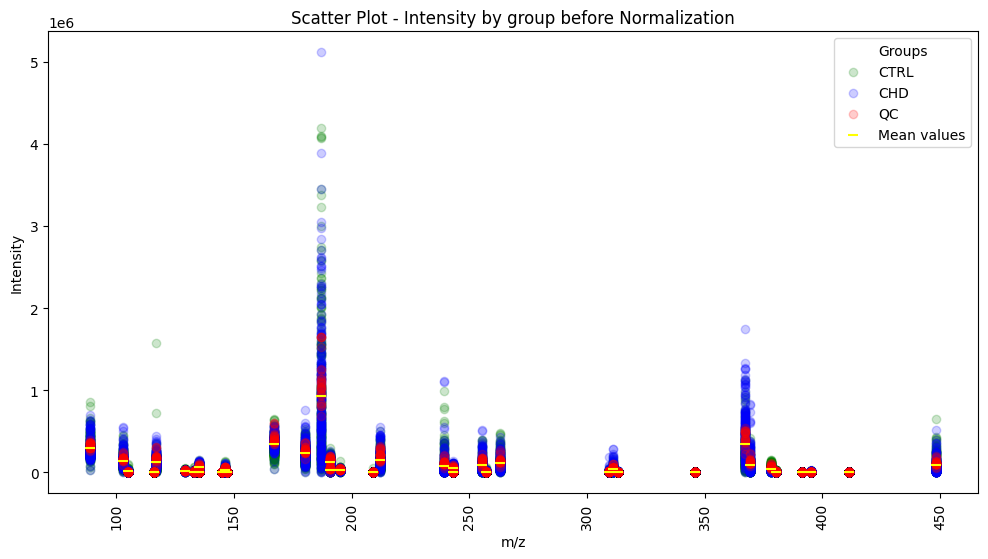

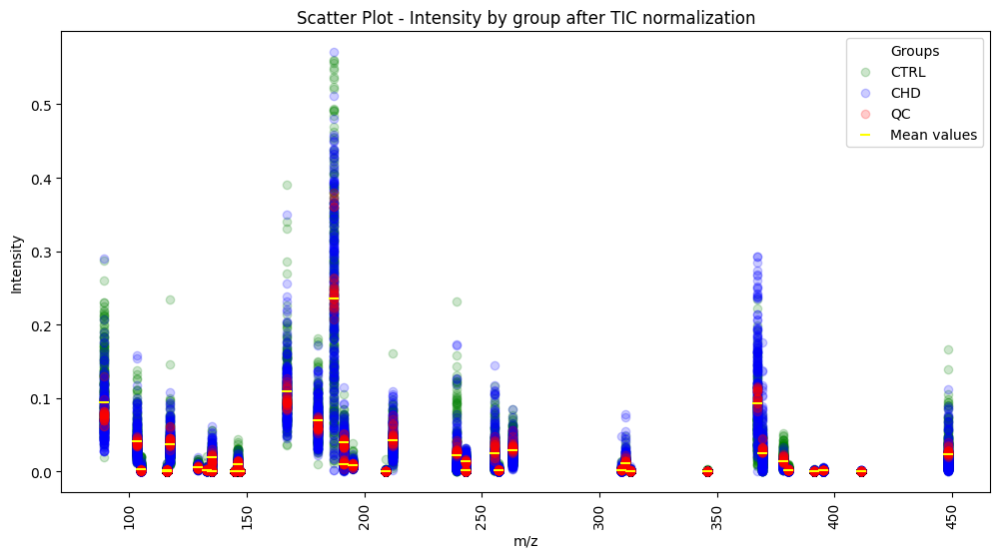

In [ ]:
''' PRE-TIC NORMALIZATION SCATTER PLOT (2) '''
intensity_data = df_neg.iloc[1:, 0:]
sample_names = df_neg.index[1:].to_numpy()

# Extract labels from the rows
group_labels = pd.Series(sample_names).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))
colors = {'QC': 'red', 'CTRL': 'green', 'CHD': 'blue'} # blind friendly :)

for group in [ 'CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names[group_labels == group]
    group_data = intensity_data.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_neg, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_neg.iloc[1:].mean()
plt.scatter(mz_values_neg, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group before Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

''' POST-TIC NORMALIZATION SCATTER PLOT (2) '''

intensity_data2 = df_neg_TIC_normalization.iloc[1:, 0:]
sample_names2 = df_neg_TIC_normalization.index[1:].to_numpy()

# Extract labels from the rows
group_labels2 = pd.Series(sample_names2).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))

for group in ['CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names2[group_labels2 == group]
    group_data = intensity_data2.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_neg, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_neg_TIC_normalization.iloc[1:].mean()
plt.scatter(mz_values_neg, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group after TIC normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()


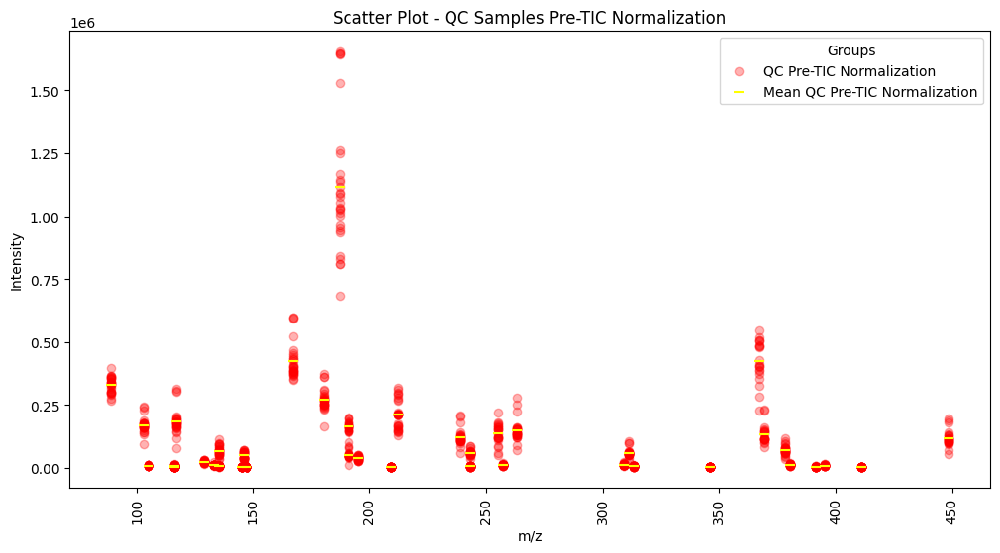

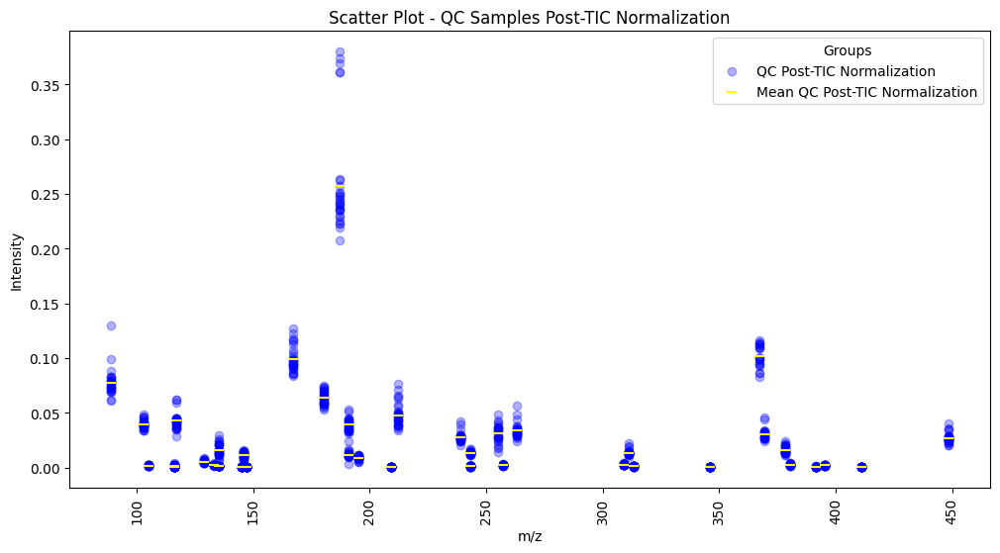

In [ ]:
''' SCATTER PLOT ONLY QC (2) '''
# Pre-TIC normalization
qc_samples_pre = sample_names[group_labels == 'QC']
qc_data_pre = intensity_data.loc[qc_samples_pre]

# Post-TIC normalization
qc_samples_post = sample_names2[group_labels2 == 'QC']
qc_data_post = intensity_data2.loc[qc_samples_post]

''' SCATTER PLOT QC - PRE-TIC NORMALIZATION '''
plt.figure(figsize=(12, 6))
# Scatter plot QC pre-normalization
for sample in qc_data_pre.index:
    plt.scatter(mz_values_neg, qc_data_pre.loc[sample], alpha=0.3, color='red', label='QC Pre-TIC Normalization' if sample == qc_data_pre.index[0] else "")

# Mean QC pre-normalization
plt.scatter(mz_values_neg, mean_qc_pre.values, color='yellow', label='Mean QC Pre-TIC Normalization', s=50, marker='_')

plt.title("Scatter Plot - QC Samples Pre-TIC Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

''' SCATTER PLOT QC - POST-TIC NORMALIZATION '''
mean_qc_post = qc_data_post.iloc[1:].mean()

plt.figure(figsize=(12, 6))

# Scatter plot QC post-TIC normalization
for sample in qc_data_post.index:
    plt.scatter(mz_values_neg, qc_data_post.loc[sample], alpha=0.3, color='blue', label='QC Post-TIC Normalization' if sample == qc_data_post.index[0] else "")

# Mean QC post-TIC normalization
plt.scatter(mz_values_neg, mean_qc_post.values, color='yellow', label='Mean QC Post-TIC Normalization', s=50, marker='_')

plt.title("Scatter Plot - QC Samples Post-TIC Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

###3D plots

3D plots useful for visually recognize how changes in intensities (i.e. normalization processes) affect the datasets

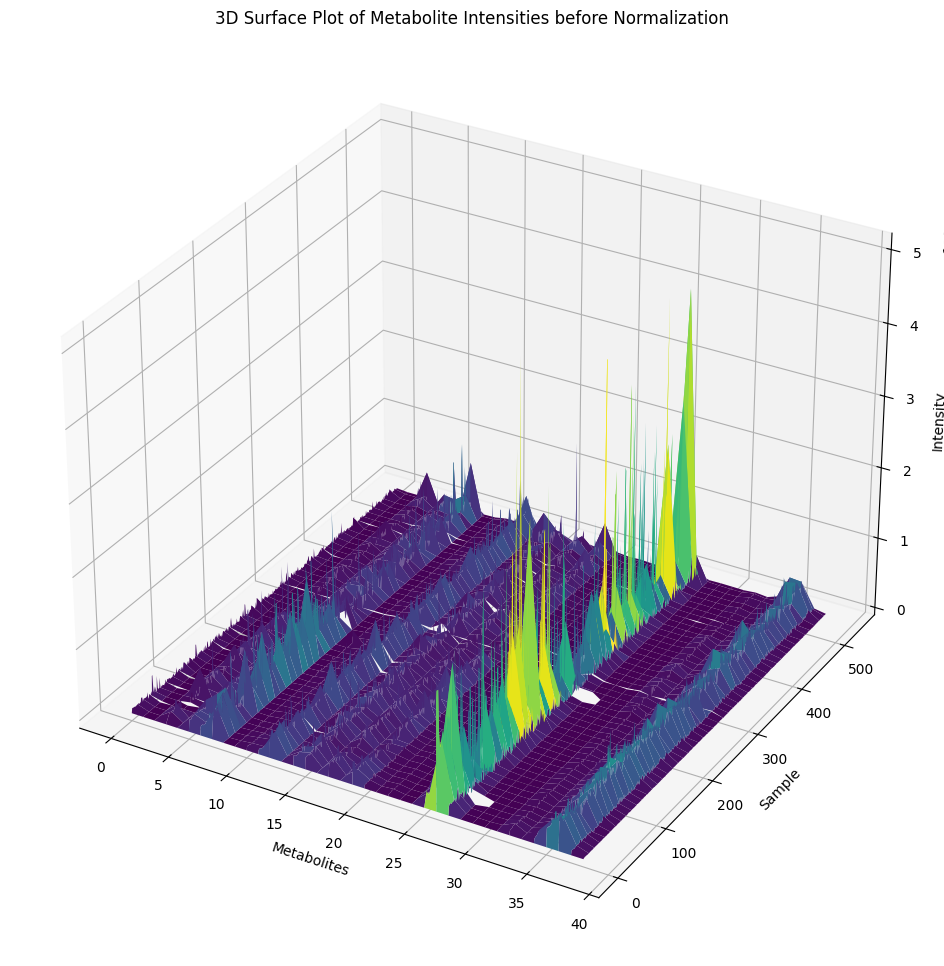

In [ ]:
df_neg_clean = df_neg.apply(pd.to_numeric)

x = np.arange(df_neg_clean.shape[1])
y = np.arange(df_neg_clean.shape[0])
x, y = np.meshgrid(x, y)

z = df_neg_clean.values

fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, z, cmap='viridis')


ax.set_xlabel('Metabolites')
ax.set_ylabel('Sample')
ax.set_zlabel('Intensity')
ax.set_title('3D Surface Plot of Metabolite Intensities before Normalization')

plt.show()

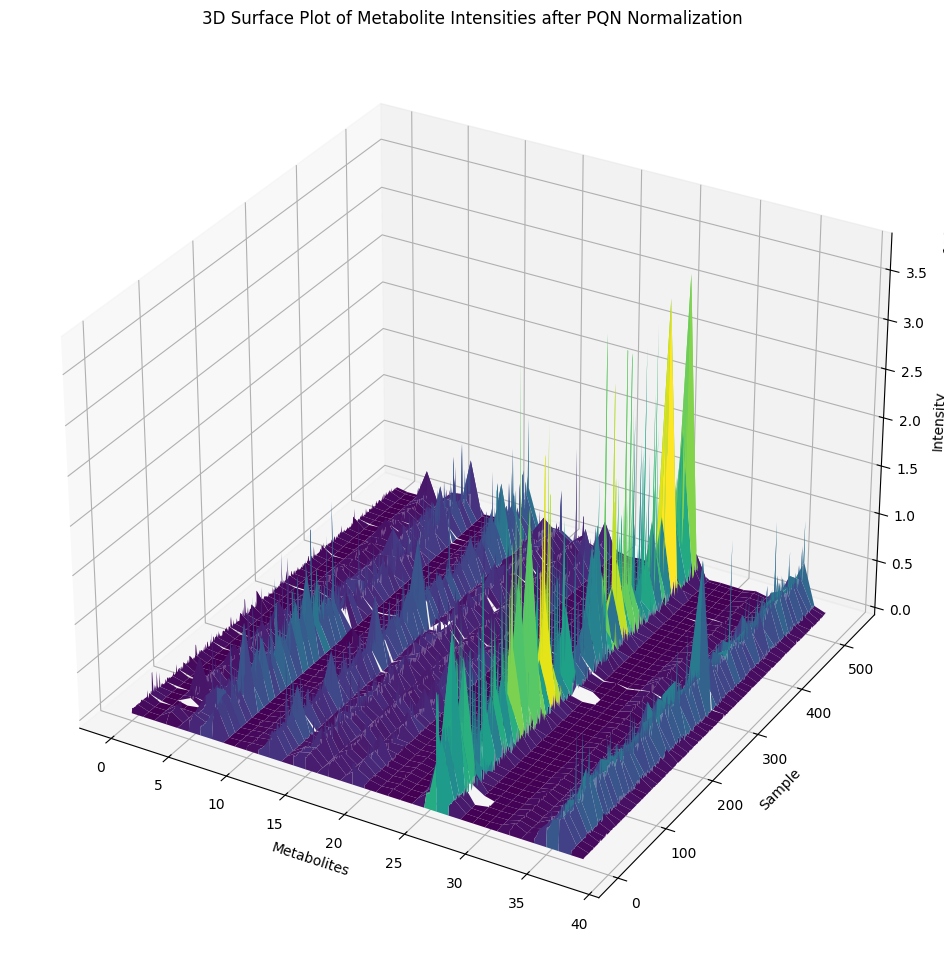

In [ ]:
df_neg_norm = df_neg_pqn.apply(pd.to_numeric)

x = np.arange(df_neg_norm.shape[1])
y = np.arange(df_neg_norm.shape[0])
x, y = np.meshgrid(x, y)

z = df_neg_norm.values

fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, z, cmap='viridis')


ax.set_xlabel('Metabolites')
ax.set_ylabel('Sample')
ax.set_zlabel('Intensity')
ax.set_title('3D Surface Plot of Metabolite Intensities after PQN Normalization')

plt.show()

###Average intensities plots

Those plots are useful for analyzing the mean differences of the samples in the datasets before and after some process, such as normalization.

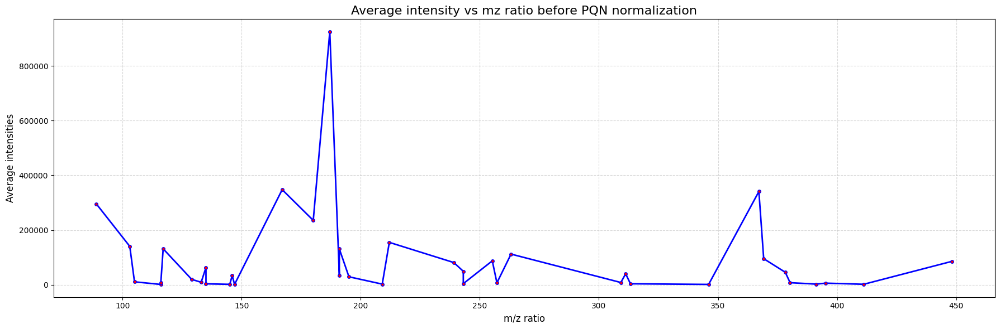

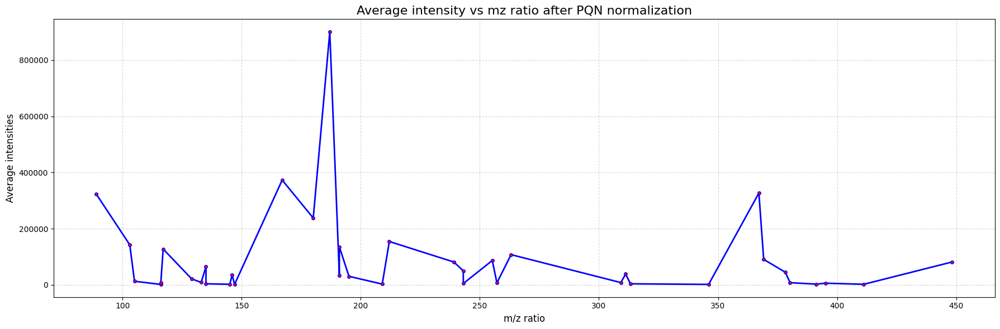

In [ ]:

df_neg_sorted = df_neg_clean[df_neg_clean.iloc[0].sort_values().index]

x_values = df_neg_sorted.iloc[0].values
y_values = df_neg_sorted.iloc[1:].mean(axis=0).values

mask = ~np.isnan(x_values) & ~np.isnan(y_values)

x_interp = np.interp(np.arange(len(x_values)), np.arange(len(x_values))[mask], x_values[mask])
y_interp = np.interp(np.arange(len(y_values)), np.arange(len(y_values))[mask], y_values[mask])

plt.figure(figsize=(18, 6))
plt.plot(x_interp, y_interp, linestyle='-', linewidth=2, color='blue', marker='o', markersize=4, markerfacecolor='red')

plt.title('Average intensity vs mz ratio before PQN normalization', fontsize=16)
plt.xlabel('m/z ratio', fontsize=12)
plt.ylabel('Average intensities', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()



df_neg_sorted2 = df_neg_pqn[df_neg_clean.iloc[0].sort_values().index]
df_neg_sorted2 = df_neg_sorted2.apply(pd.to_numeric, errors='coerce')
y_values = df_neg_sorted2.iloc[1:].mean(axis=0).values

mask = ~np.isnan(x_values) & ~np.isnan(y_values)

x_interp = np.interp(np.arange(len(x_values)), np.arange(len(x_values))[mask], x_values[mask])
y_interp = np.interp(np.arange(len(y_values)), np.arange(len(y_values))[mask], y_values[mask])

plt.figure(figsize=(18, 6))
plt.plot(x_interp, y_interp, linestyle='-', linewidth=2, color='blue', marker='o', markersize=4, markerfacecolor='red')

plt.title('Average intensity vs mz ratio after PQN normalization', fontsize=16)
plt.xlabel('m/z ratio', fontsize=12)
plt.ylabel('Average intensities', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

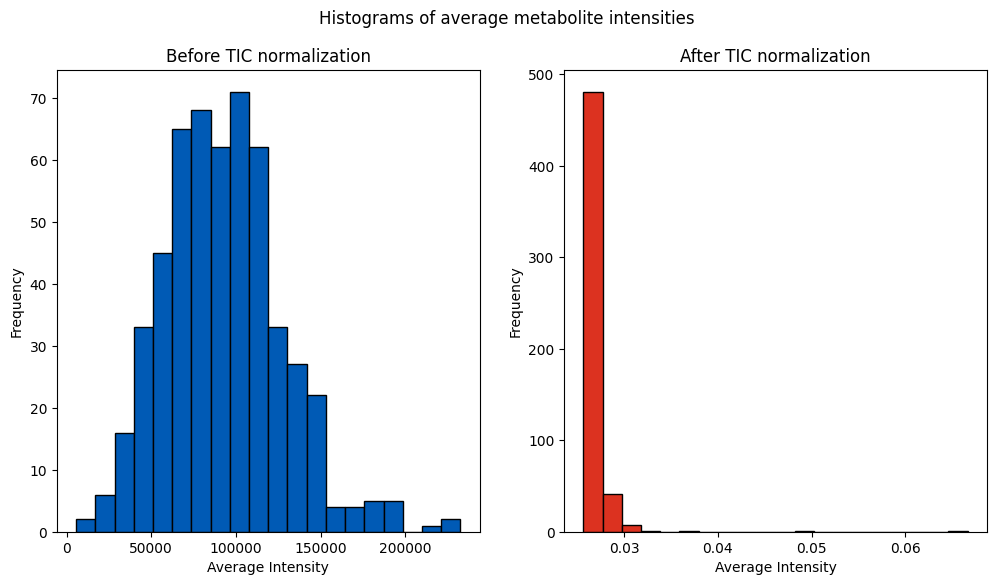

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

fig.suptitle('Histograms of average metabolite intensities')
ax1.hist(df_neg_clean.drop('m/z meas.').mean(axis=1), bins=20, color='#005AB5', edgecolor='black')
ax1.set_xlabel('Average Intensity')
ax1.set_ylabel('Frequency')
ax1.set_title('Before TIC normalization')
ax2.hist(df_neg_TIC_normalization.drop('m/z meas.').mean(axis=1), bins=20, color='#DC3220', edgecolor='black')
ax2.set_xscale('linear')
ax2.set_xlabel('Average Intensity')
ax2.set_ylabel('Frequency')
ax2.set_title('After TIC normalization')
plt.show()

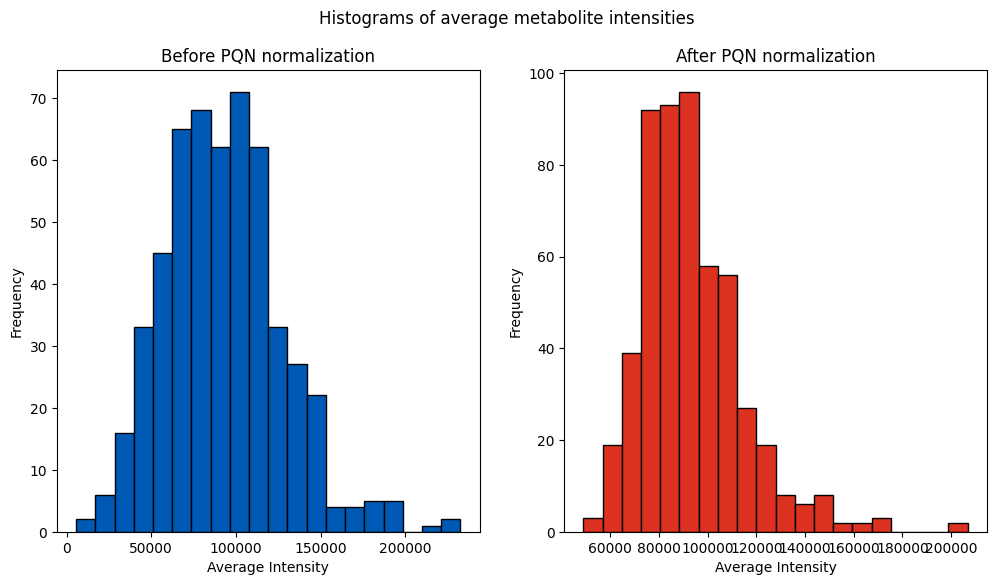

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

fig.suptitle('Histograms of average metabolite intensities')
ax1.hist(df_neg_clean.drop('m/z meas.').mean(axis=1), bins=20, color='#005AB5', edgecolor='black')
ax1.set_xlabel('Average Intensity')
ax1.set_ylabel('Frequency')
ax1.set_title('Before PQN normalization')
ax2.hist(df_neg_pqn.drop('m/z meas.').mean(axis=1), bins=20, color='#DC3220', edgecolor='black')
ax2.set_xlabel('Average Intensity')
ax2.set_ylabel('Frequency')
ax2.set_title('After PQN normalization')
plt.show()

## **Imputation of missing values**

Data imputation is a method for retaining the majority of the dataset's data and information by substituting missing data with a different value. In this study, Constant Imputation is applied by replacing missing values (NaN) in each feature (column) with 20% of the minimum value of that column. Note that zeros are not present in both datasets.

In [ ]:
def missing_values_substitution(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  for col in df.columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')
    col_min = df[col].min(skipna=True)
    df[col] = df[col].fillna(col_min / 5)

  return df

if 'm/z meas.' in df_neg_TIC_normalization.index:
  df_neg_TIC_normalization.drop('m/z meas.', inplace=True)
df_neg_TIC_norm = missing_values_substitution(df_neg_TIC_normalization)

if 'm/z meas.' in df_neg_pqn.index:
  df_neg_pqn.drop('m/z meas.', inplace=True)
df_neg_pqn_norm = missing_values_substitution(df_neg_pqn)
df_neg_pqn_norm

Utility function to group samples.

In [ ]:
def group_samples(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  df.loc[:, 'group'] = df.index.to_series().apply(lambda x: 'QC' if x.startswith('QC')
                                         else 'CHD' if x.startswith('CHD')
                                         else 'CTRL' if x.startswith('CTRL')
                                         else 'Other')
  return df

## Log transformation and autoscaling

Log Transformation and Autoscaling are applied to preprocess the data:

Log Transformation -> each feature (column) is transformed using the logarithm (base 10) to reduce skewness and stabilize variance. Since our original continuous data do not follow the bell curve, we can log transform this data to make it as “normal” as possible so that the statistical analysis results from this data become more valid.

Autoscaling -> Each feature is standardized by subtracting its mean and dividing by its standard deviation. This process centers the data around zero with a standard deviation of one, ensuring that all features contribute equally to the analysis.

In [ ]:
def log_transform(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  for i in range(0, df.shape[0]):
    for j in range(0, df.shape[1]):
      df.iloc[i,j] = log(df.iloc[i,j], 10)
  return df

neg_log_transform = log_transform(df_neg_pqn_norm)
neg_log_transform

In [ ]:
def autoscaling(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  mean = df.mean(axis=0)
  std = df.std(axis=0)
  for n, (i, j) in enumerate(zip(mean.values, std.values)):
    df.iloc[:, n] = (df.iloc[:, n] - i) / j
  return df

neg_autoscaling = autoscaling(neg_log_transform)
neg_autoscaling

Utility function to autoscale data according to given mean and standard deviation (utilized after train/test splitting).

In [ ]:
def autoscaling_mean_std(df: pd.DataFrame, mean, std) -> pd.DataFrame:

  df = df.copy()
  for n, (i, j) in enumerate(zip(mean.values, std.values)):
    df.iloc[:, n] = (df.iloc[:, n] - i) / j
  return df

## PCA

Principal Component Analysis (PCA) is a widely used statistical technique for dimensionality reduction (while preserving variance) and data visualization. Since PCA uses the entirety of the available data to calculate principal components, it was important to ensure that all variables contribute to the analysis,
which is an additional reasoning for previous imputation. Initially, PCA was used to visualize, in a separate way for different ionizations (ESI+ and ESI-), the datasets after the pre-processing, including the quality control (QC) samples.

In [ ]:
#utility function to group samples
def group_samples(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  df.loc[:, 'group'] = df.index.to_series().apply(lambda x: 'QC' if x.startswith('QC')
                                         else 'CHD' if x.startswith('CHD')
                                         else 'CTRL' if x.startswith('CTRL')
                                         else 'Other')
  return df

In [ ]:
pca = PCA()
PCA.set_output(pca, transform="pandas")
neg2 = group_samples(neg_autoscaling)
neg2 = neg2.groupby('group').apply(lambda x: x.drop('group', axis=1))
df_pca = pca.fit_transform(neg2)
df_pca

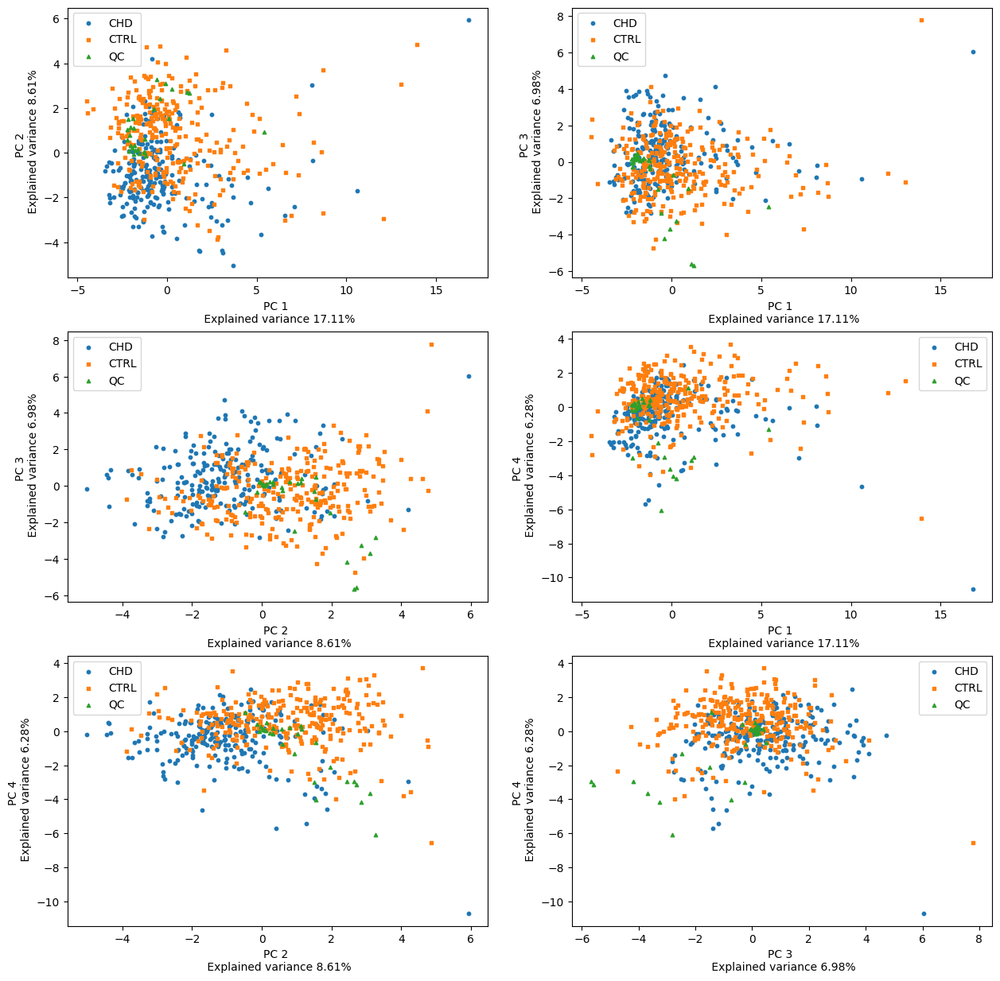

In [ ]:
fig, axes = plt.subplots(3,2, figsize=(15,15))
color =['tab:blue', 'tab:orange', 'tab:green']
group = [ 'CHD', 'CTRL','QC']
marker=['o','s','^']
pca_combinations = [(0, 1), (0, 2), (1, 2), (0, 3), (1, 3), (2, 3)]

for i, (pca_x, pca_y) in enumerate(pca_combinations):
    ax = axes[i//2,i%2]
    for j in range(0,3):
      ax.scatter(df_pca.loc[df_pca.index.get_level_values(0).isin([group[j]])][f'pca{pca_x}'],
                df_pca.loc[df_pca.index.get_level_values(0).isin([group[j]])][f'pca{pca_y}'],c=color[j], label=group[j], marker=marker[j],s=10)
    ax.set_xlabel(f'PC {pca_x+1} \n Explained variance {pca.explained_variance_ratio_[pca_x]*100:.2f}%')
    ax.set_ylabel(f'PC {pca_y+1} \n Explained variance {pca.explained_variance_ratio_[pca_y]*100:.2f}%')
    ax.legend()


plt.show()

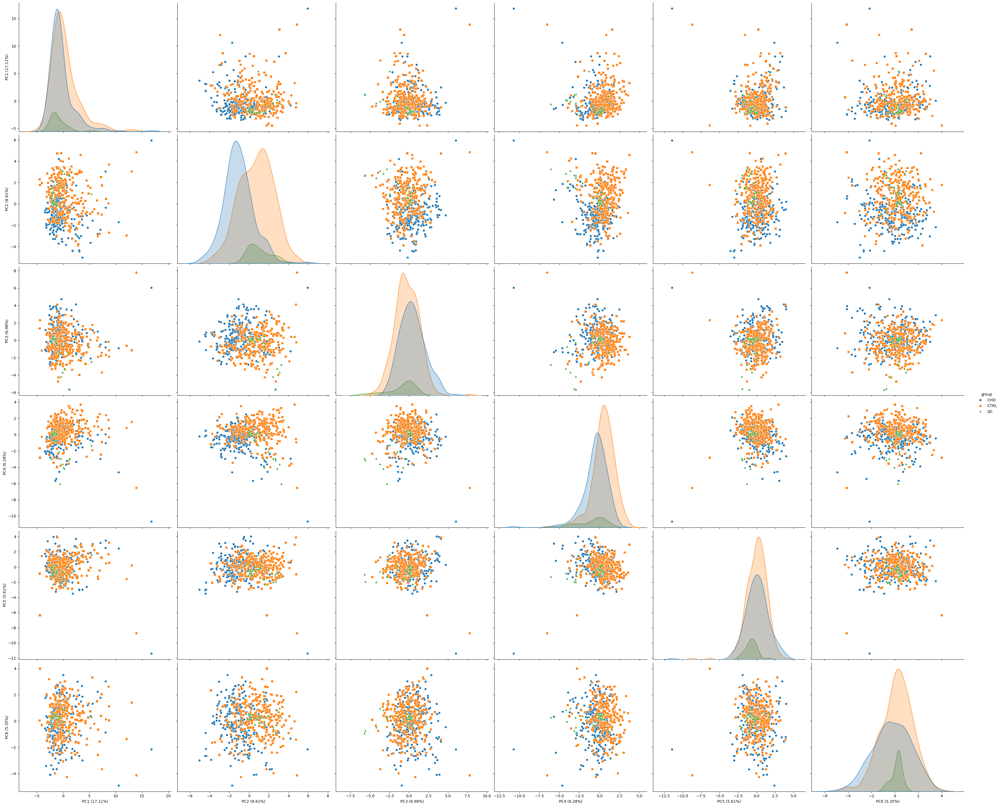

In [ ]:
import seaborn as sns
pca_labels = [f"PC{i+1} ({pca.explained_variance_ratio_[i]*100:.2f}%)" for i in range(38)]
df_pca_sns = df_pca.copy().reset_index()
df_pca_sns.rename(columns={f"pca{i}": pca_labels[i] for i in range(len(pca_labels))}, inplace=True)
ax = sns.pairplot(
    df_pca_sns,
    vars = pca_labels[:6],
    hue ='group',
    palette = {'QC': 'tab:green','CHD': 'tab:blue', 'CTRL': 'tab:orange'},
    markers = ['o', 's', '^'],
    diag_kind = "kde",
    height = 5,
    aspect = 1.2
)
plt.show()


In [ ]:
loadings = pd.DataFrame(pca.components_.T, columns=df_pca.columns, index=neg_autoscaling.columns)
loadings

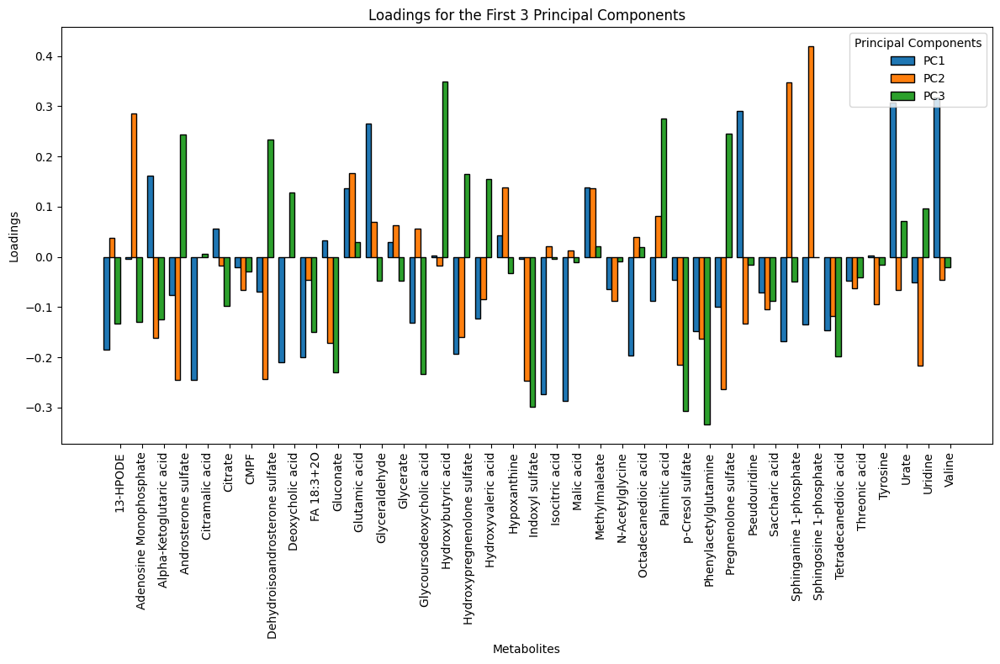

In [ ]:
plt.figure(figsize=(12, 8))
x_labels = neg2.columns


bar_width = 0.25
x = np.arange(len(x_labels))

pc_colors = sns.color_palette("tab10", n_colors=3)


for i in range(3):

    loadings_values = loadings[f'pca{i}'].values


    plt.bar(
        x + i * bar_width,
        loadings_values,
        color=pc_colors[i],
        edgecolor='black',
        width=bar_width,
        label=f'PC{i+1}'
    )

plt.xticks(x + (bar_width * 2.5), x_labels, rotation=90)
plt.ylabel("Loadings")
plt.xlabel("Metabolites")
plt.title("Loadings for the First 3 Principal Components")
plt.legend(title="Principal Components", loc='upper right')
plt.tight_layout()


plt.show()

For the scree plot, on the y-axis there aren't eigenvalues but the explained variance which is indeed correlated.

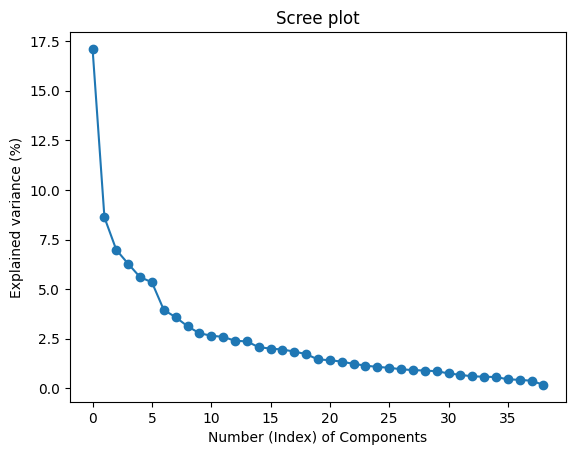

In [ ]:
plt.plot(pca.explained_variance_ratio_ * 100, 'o-')
plt.title('Scree plot')
plt.xlabel('Number (Index) of Components')
plt.ylabel('Explained variance (%)')
plt.show()

A cumulative scree plot is used to determine the number of principal components (PCs) required to account for 90% of the total variance.

25


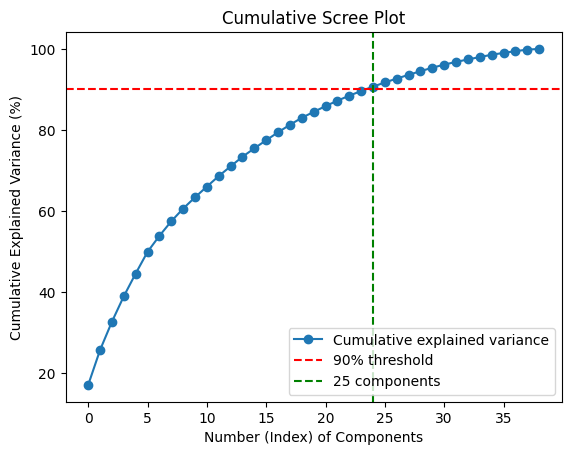

In [ ]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_) * 100

n_components_90 = np.argmax(cumulative_variance >= 90) + 1
print(n_components_90)


plt.plot(cumulative_variance, 'o-', label='Cumulative explained variance')
plt.axhline(y=90, color='r', linestyle='--', label='90% threshold')
plt.axvline(x=n_components_90-1, color='g', linestyle='--', label=f'{n_components_90} components')

plt.title('Cumulative Scree Plot')
plt.xlabel('Number (Index) of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.legend()
plt.show()


###PCA without QC samples and with optimal number of components

In [ ]:
pca_optimal = PCA(n_components=n_components_90)
PCA.set_output(pca_optimal, transform="pandas")
df_pca_optimal = pca_optimal.fit_transform(neg_autoscaling)
df_pca_optimal

In [ ]:
neg3 = group_samples(neg_autoscaling)
neg3 = neg3.groupby('group').apply(lambda x: x.drop('group', axis=1))

for i in neg3.index.get_level_values(0):
  if i == 'QC':
    neg3.drop(index=i, inplace=True, level=0)

df_pca_optimal = pca_optimal.fit_transform(neg3)
df_pca_optimal

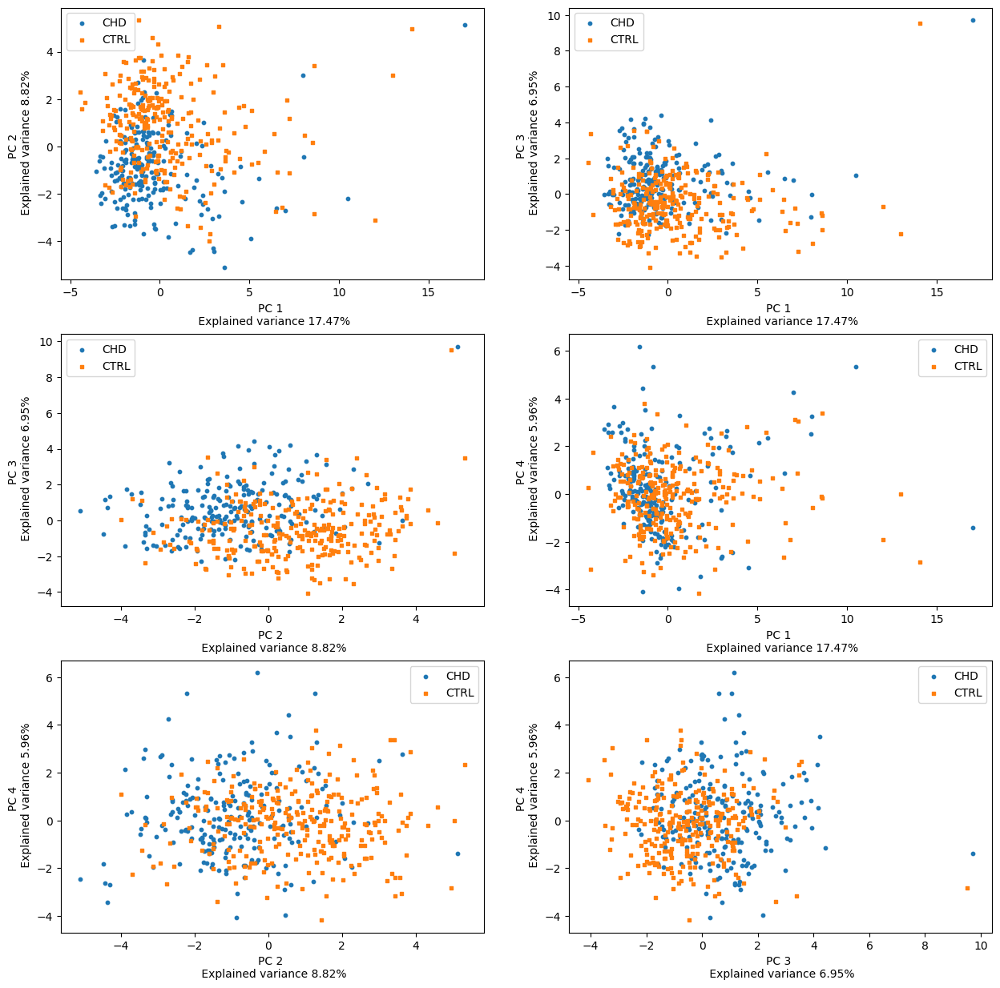

In [ ]:
fig, axes = plt.subplots(3,2, figsize=(15,15))
color =['tab:blue', 'tab:orange', 'tab:green']
group = [ 'CHD', 'CTRL']
marker=['o','s']
pca_combinations = [(0, 1), (0, 2), (1, 2), (0, 3), (1, 3), (2, 3)]

for i, (pca_x, pca_y) in enumerate(pca_combinations):
    ax = axes[i//2,i%2]
    for j in range(0,2):
      ax.scatter(df_pca_optimal.loc[df_pca_optimal.index.get_level_values(0).isin([group[j]])][f'pca{pca_x}'],
                df_pca_optimal.loc[df_pca_optimal.index.get_level_values(0).isin([group[j]])][f'pca{pca_y}'],c=color[j] , label=group[j],marker=marker[j],s=10)
    ax.set_xlabel(f'PC {pca_x+1} \n Explained variance {pca_optimal.explained_variance_ratio_[pca_x]*100:.2f}%')
    ax.set_ylabel(f'PC {pca_y+1} \n Explained variance {pca_optimal.explained_variance_ratio_[pca_y]*100:.2f}%')
    ax.legend()


plt.show()

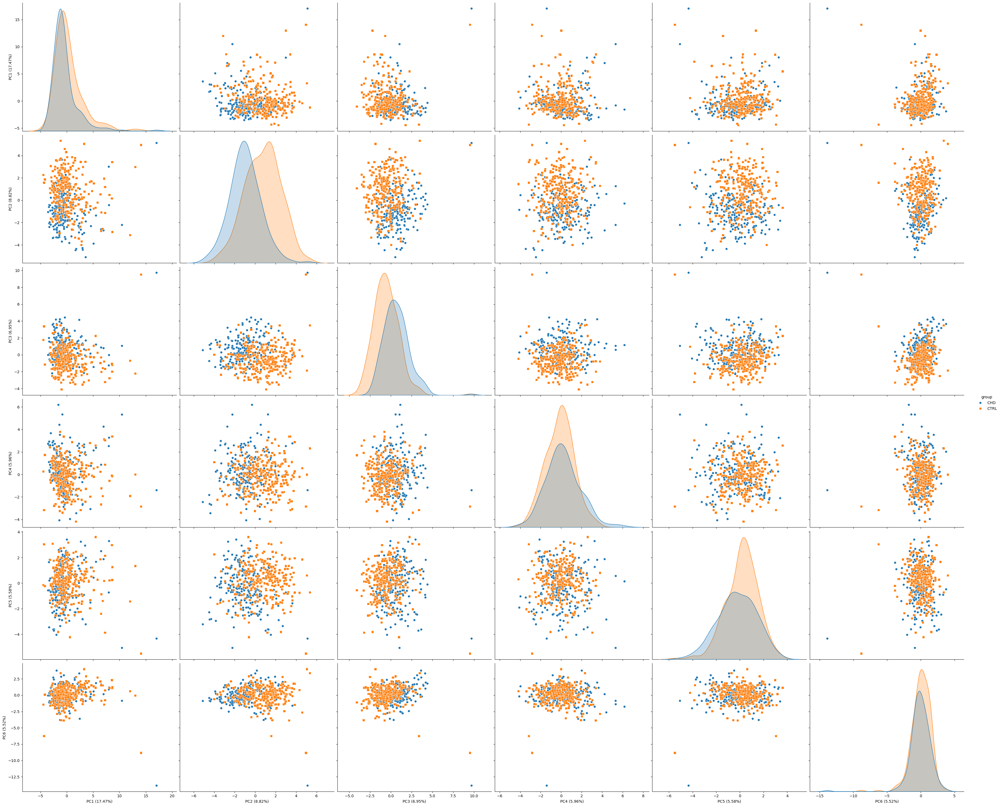

In [ ]:
import seaborn as sns
pca_labels = [f"PC{i+1} ({pca_optimal.explained_variance_ratio_[i]*100:.2f}%)" for i in range(25)]
df_pca_sns = df_pca_optimal.copy().reset_index()
df_pca_sns.rename(columns={f"pca{i}": pca_labels[i] for i in range(len(pca_labels))}, inplace=True)
ax = sns.pairplot(
    df_pca_sns,
    vars=pca_labels[:6],
    hue='group',
    palette={'CHD': 'tab:blue', 'CTRL': 'tab:orange'},
    markers=['o', 's'],
    diag_kind="kde",
    height=5,
    aspect=1.2
)
plt.show()


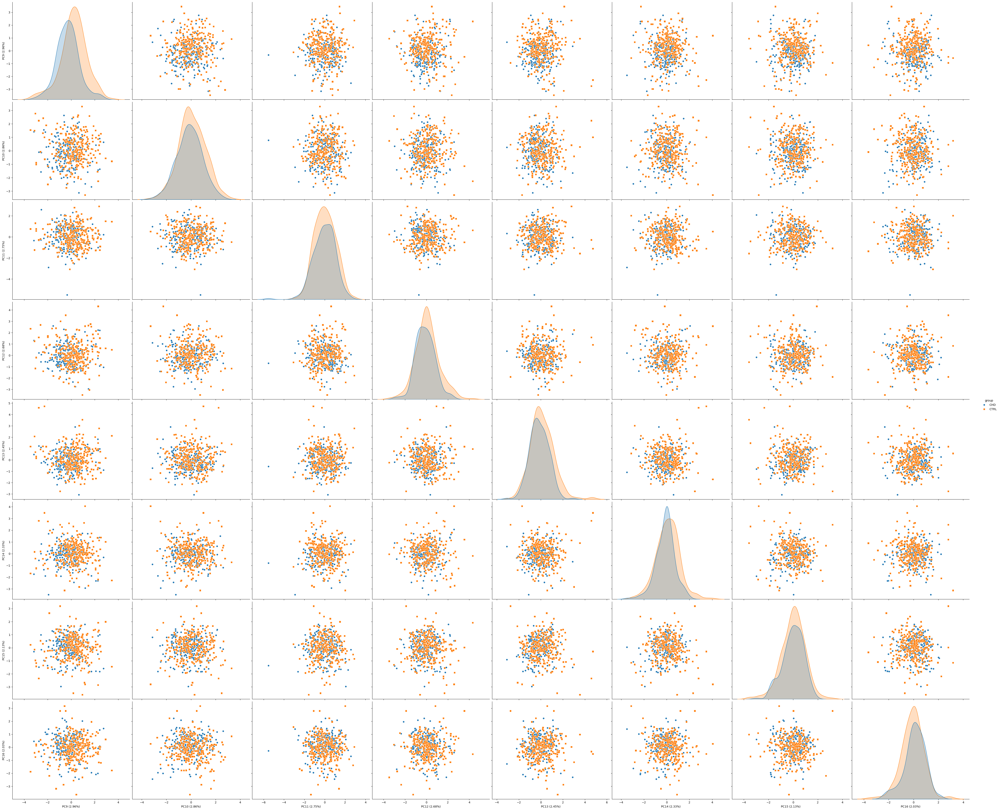

In [ ]:
ax = sns.pairplot(
    df_pca_sns,
    vars=pca_labels[8:16],
    hue='group',
    palette={'CHD': 'tab:blue', 'CTRL': 'tab:orange'},
    markers=['o', 's'],
    diag_kind="kde",
    height=5,
    aspect=1.2
)

plt.show()

In [ ]:
loading_optimal = pd.DataFrame(pca_optimal.components_.T, columns=df_pca_optimal.columns, index=neg_autoscaling.columns)
loading_optimal

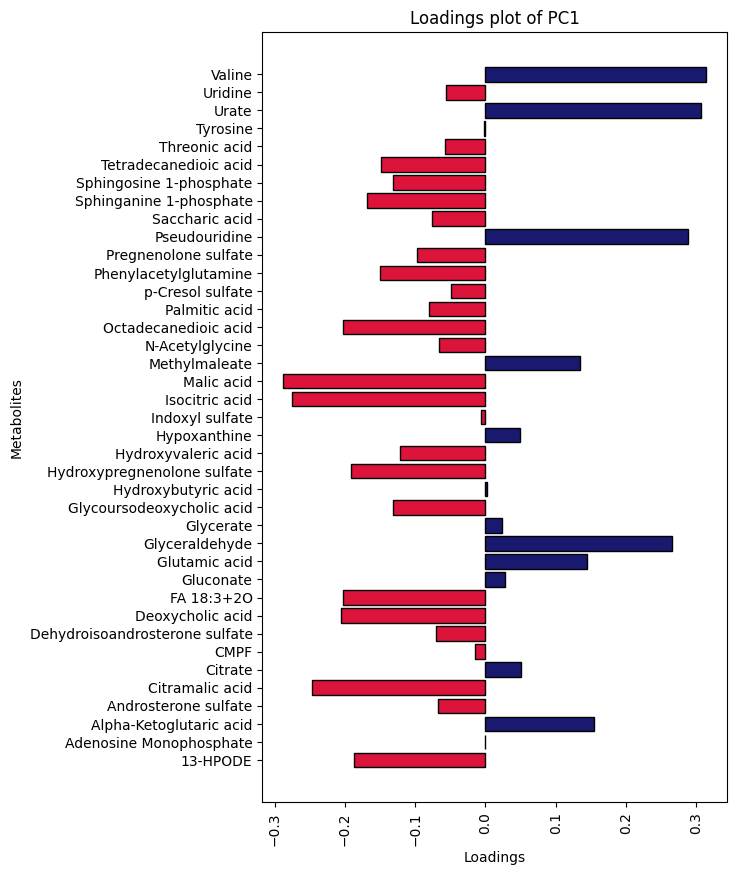

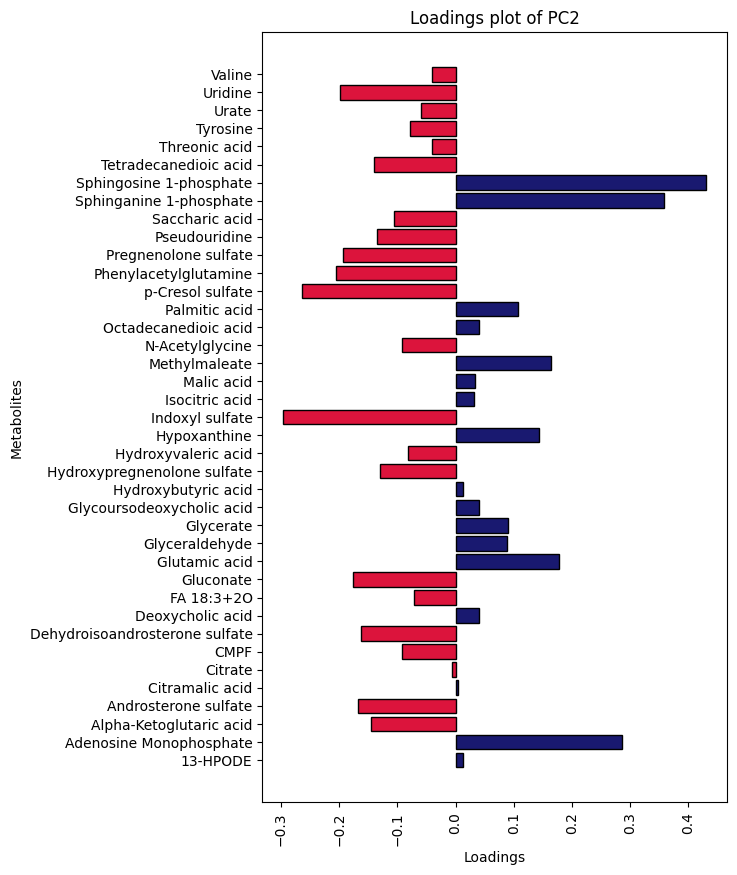

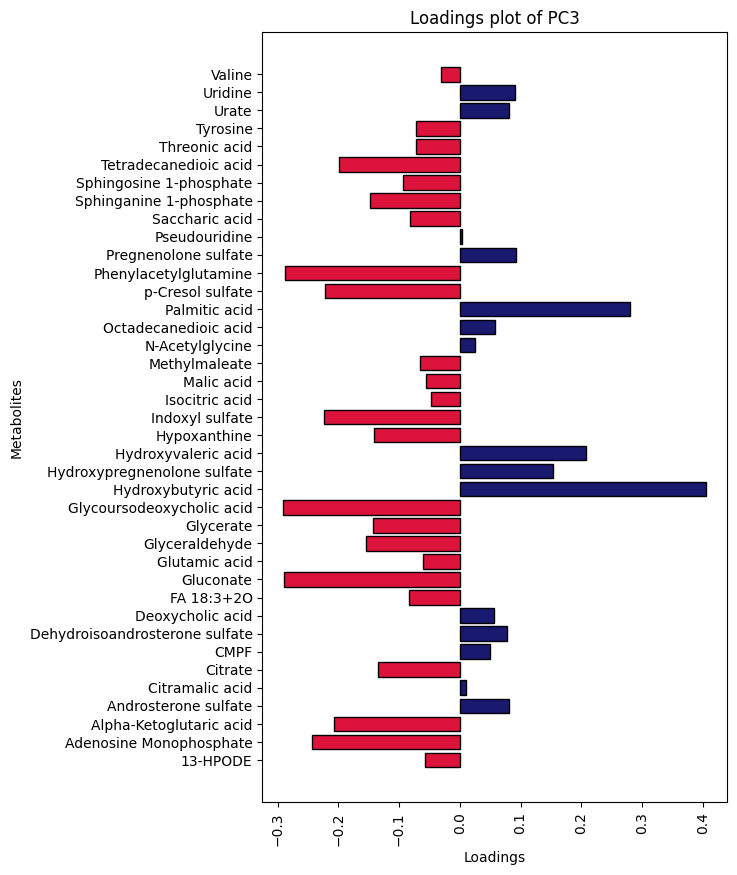

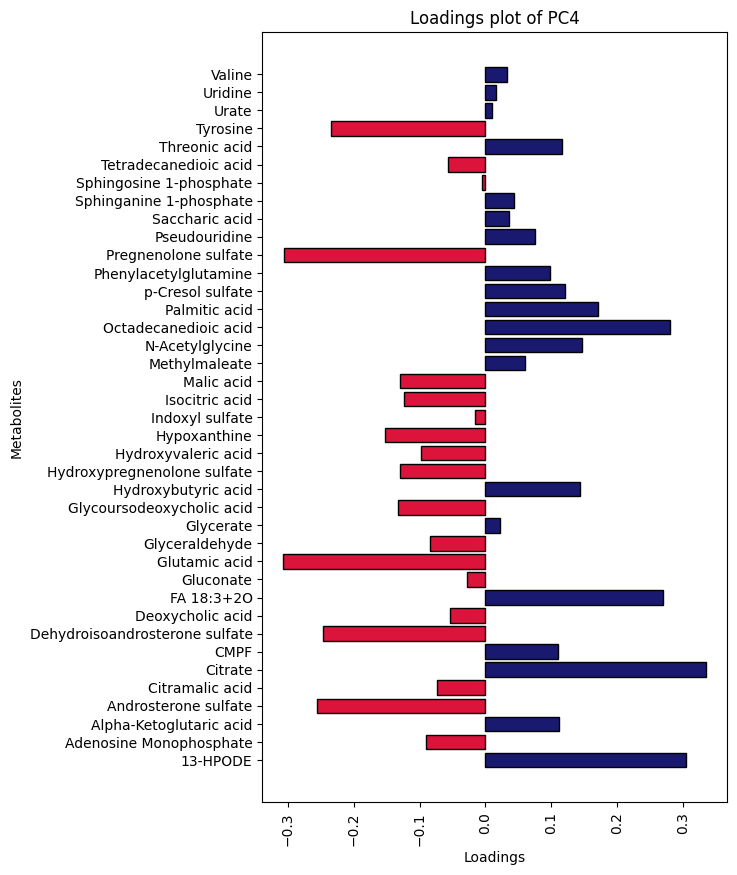

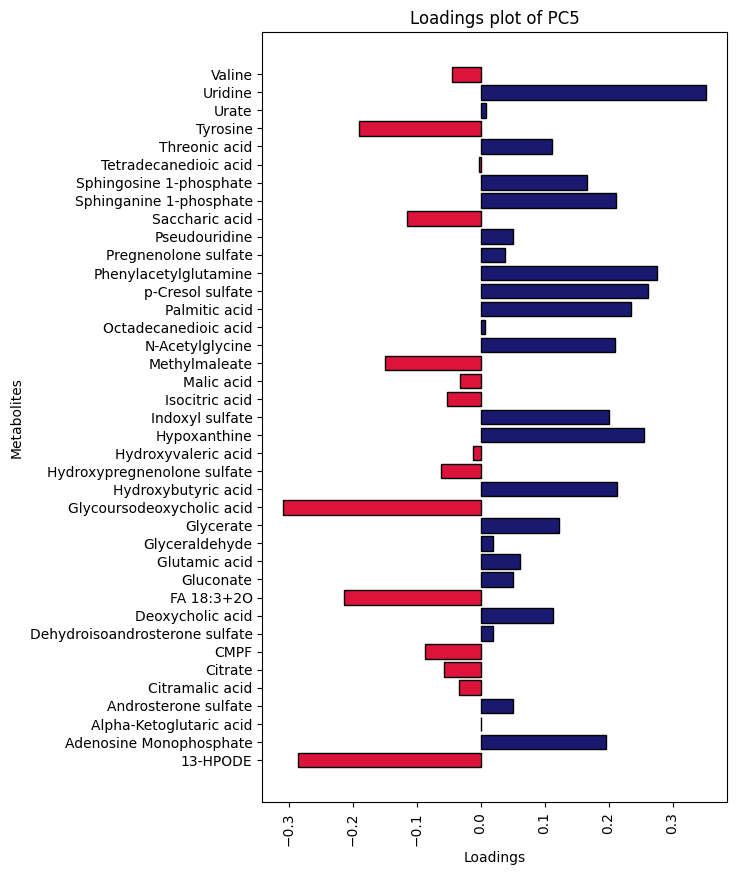

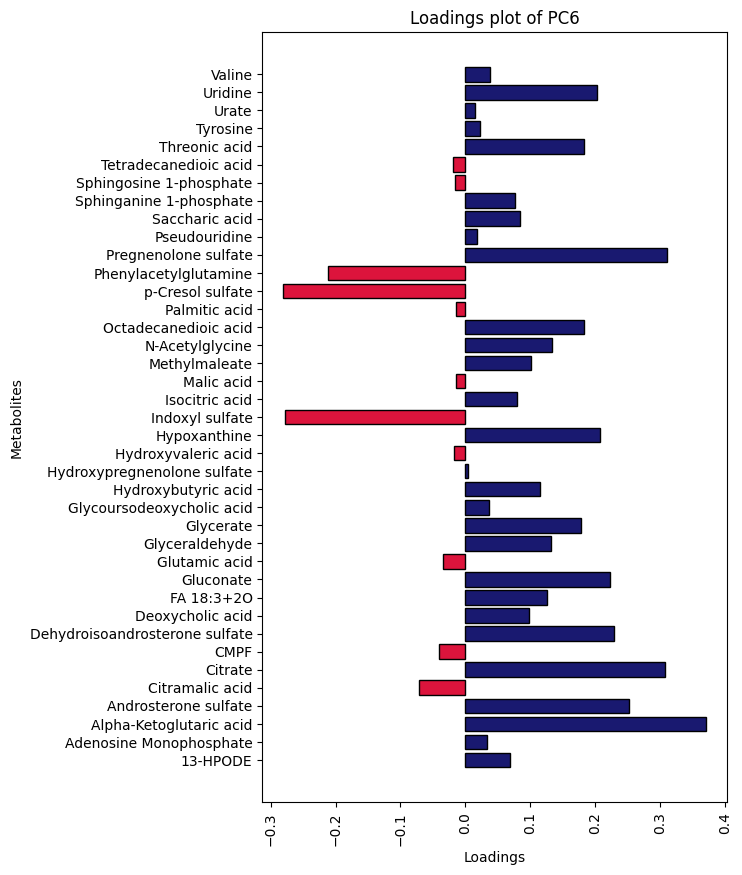

In [ ]:
rescale = lambda y: ('midnightblue' if y > 0 else 'crimson')
for i in range(6):
  plt.subplots(figsize=(6, 10))
  plt.xticks(rotation=90)
  plt.title(f"Loadings plot of PC{i+1}")
  plt.barh(neg3.columns, loading_optimal[f'pca{i}'].values, color=loading_optimal[f'pca{i}'].apply(rescale), edgecolor='black')
  plt.ylabel("Metabolites")
  plt.xlabel("Loadings")
plt.show()

# **Metabolomics positive - Preprocessing** 🍐

In [ ]:
df_pos_copy = df_pos.drop(index='m/z meas.')
df_pos_copy

## Probabilistic Quotient Normalization

In [ ]:
df_pos_pqn,_ = PQN_normalization(df_pos)
df_pos_pqn

## **TIC normalization**

In [ ]:
df_pos_TIC_normalization = TIC_normalization(df_pos)
df_pos_TIC_normalization

In order to apply other normalizations (row scaling to a constant), just utilize the function provided in the negative section.

## PLOTS

###Scatter plots

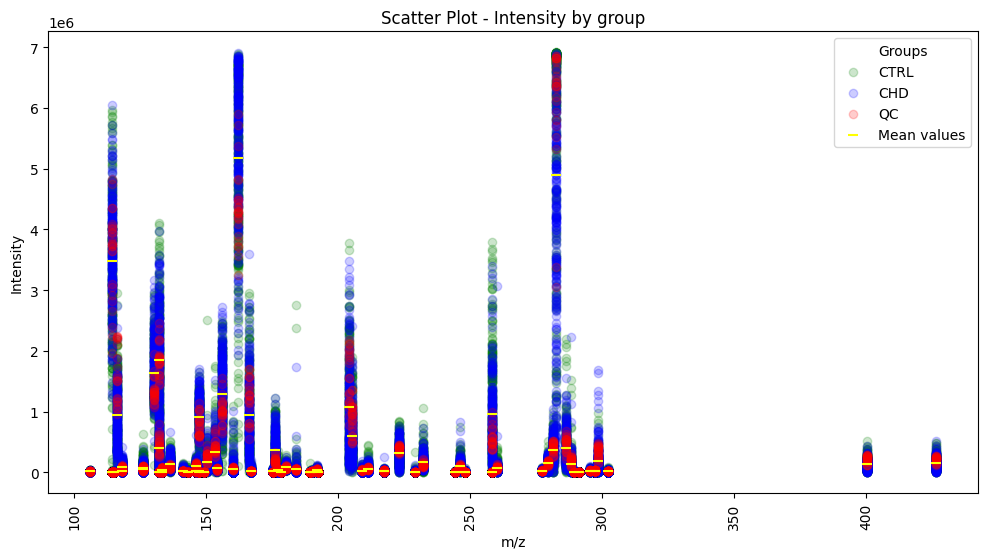

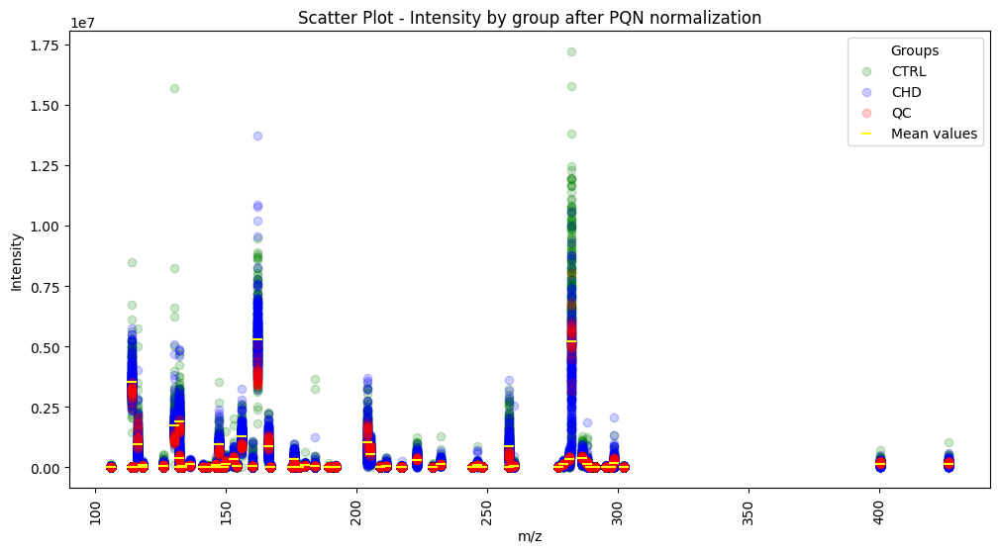

In [ ]:
''' PRE-NORMALIZATION SCATTER PLOT '''
intensity_data = df_pos.iloc[1:, 0:]
sample_names = df_pos.index[1:].to_numpy()

# Extract labels from the rows
group_labels = pd.Series(sample_names).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))
colors = {'QC': 'red', 'CTRL': 'green', 'CHD': 'blue'} # blind friendly :)

for group in [ 'CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names[group_labels == group]
    group_data = intensity_data.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_pos, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_pos.iloc[1:].mean()
plt.scatter(mz_values_pos, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

''' POST-PQN NORMALIZATION SCATTER PLOT '''
intensity_data2 = df_pos_pqn.iloc[1:, 0:]
sample_names2 = df_pos_pqn.index[1:].to_numpy()

# Extract labels from the rows
group_labels2 = pd.Series(sample_names2).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))

for group in ['CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names2[group_labels2 == group]
    group_data = intensity_data2.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_pos, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_pos_pqn.iloc[1:].mean()
plt.scatter(mz_values_pos, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group after PQN normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()


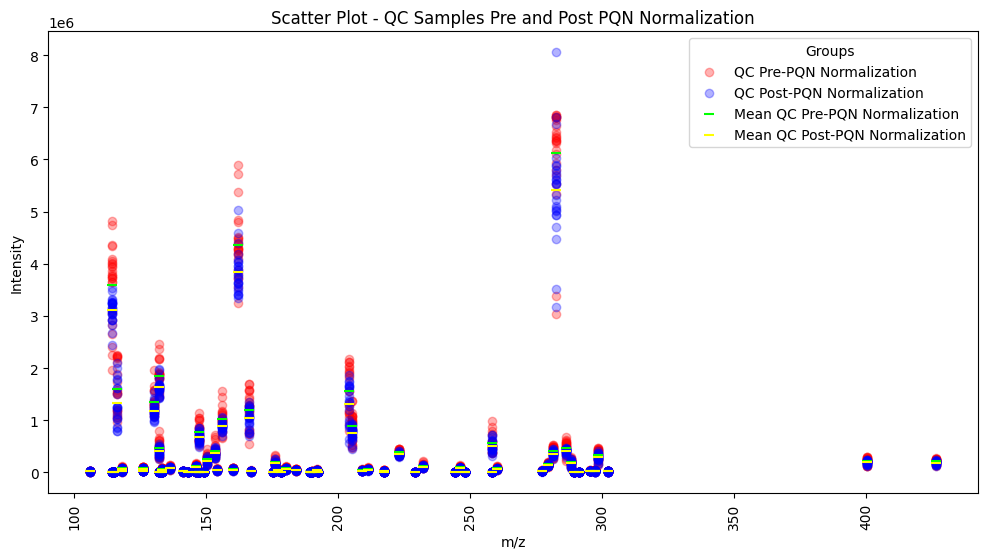

In [ ]:
''' SCATTER PLOT ONLY QC '''
# Pre-PQN normalization
qc_samples_pre = sample_names[group_labels == 'QC']
qc_data_pre = intensity_data.loc[qc_samples_pre]

# Post-PQN normalization
qc_samples_post = sample_names2[group_labels2 == 'QC']
qc_data_post = intensity_data2.loc[qc_samples_post]

plt.figure(figsize=(12, 6))

# Scatter plot QC pre-normalization
for sample in qc_data_pre.index:
    plt.scatter(mz_values_pos, qc_data_pre.loc[sample], alpha=0.3, color='red', label='QC Pre-PQN Normalization' if sample == qc_data_pre.index[0] else "")

# Scatter plot QC post-normalization
for sample in qc_data_post.index:
    plt.scatter(mz_values_pos, qc_data_post.loc[sample], alpha=0.3, color='blue', label='QC Post-PQN Normalization' if sample == qc_data_post.index[0] else "")

# means
mean_qc_pre = qc_data_pre.mean()
mean_qc_post = qc_data_post.mean()
plt.scatter(mz_values_pos, mean_qc_pre.values, color='lime', label='Mean QC Pre-PQN Normalization', s=50, marker='_')
plt.scatter(mz_values_pos, mean_qc_post.values, color='yellow', label='Mean QC Post-PQN Normalization', s=50, marker='_')

plt.title("Scatter Plot - QC Samples Pre and Post PQN Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

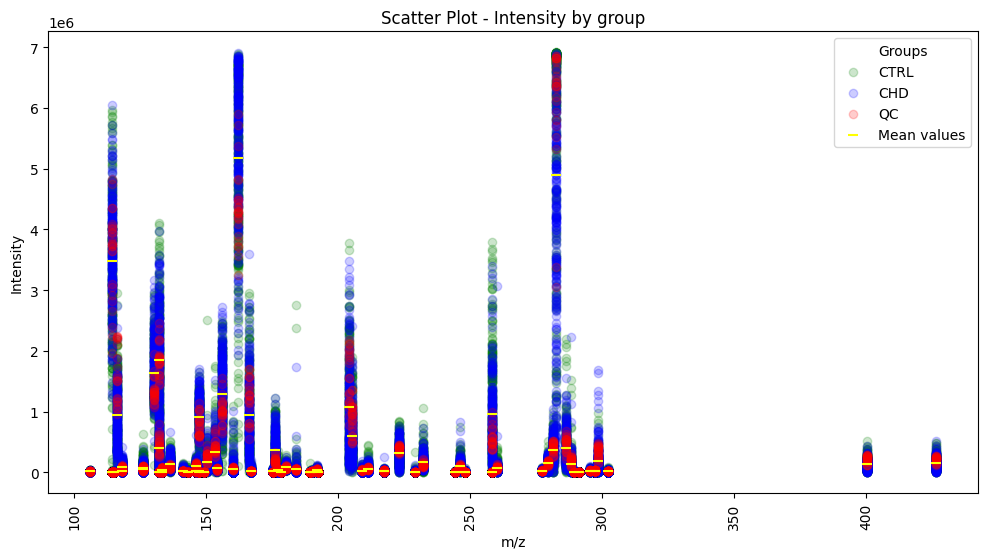

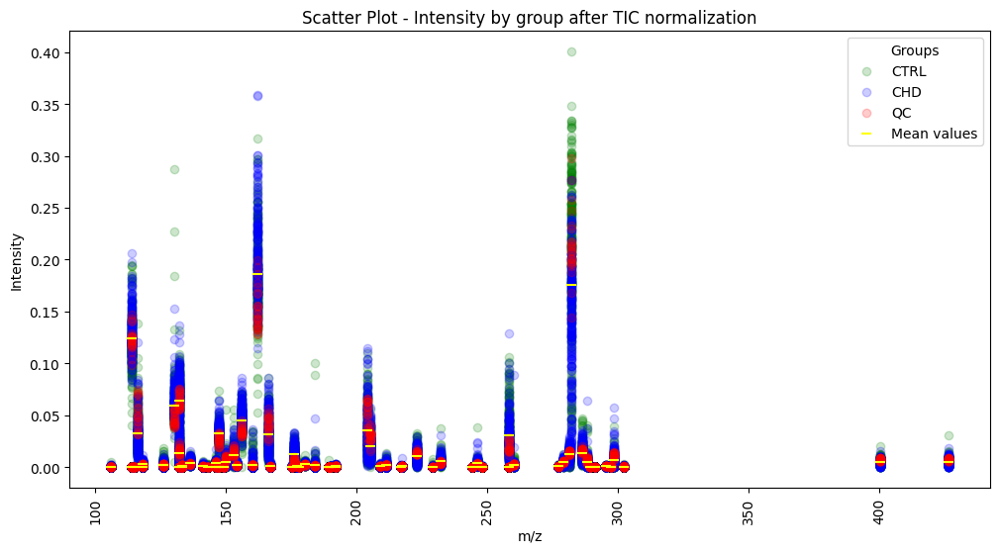

In [ ]:
''' PRE-TIC NORMALIZATION SCATTER PLOT '''
intensity_data = df_pos.iloc[1:, 0:]
sample_names = df_pos.index[1:].to_numpy()

# Extract labels from the rows
group_labels = pd.Series(sample_names).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))
colors = {'QC': 'red', 'CTRL': 'green', 'CHD': 'blue'} # blind friendly :)

for group in ['CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names[group_labels == group]
    group_data = intensity_data.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_pos, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_pos.iloc[1:].mean()
plt.scatter(mz_values_pos, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

''' POST-TIC NORMALIZATION SCATTER PLOT  '''
intensity_data2 = df_pos_TIC_normalization.iloc[1:, 0:]
sample_names2 = df_pos_TIC_normalization.index[1:].to_numpy()

# Extract labels from the rows
group_labels2 = pd.Series(sample_names2).str.extract(r'(QC|CTRL|CHD)')[0]

plt.figure(figsize=(12, 6))

for group in ['CTRL', 'CHD','QC']:
    # Select only samples of the group -> 'group'
    group_samples = sample_names2[group_labels2 == group]
    group_data = intensity_data2.loc[group_samples]

    for sample in group_data.index:
        plt.scatter(mz_values_pos, group_data.loc[sample], alpha=0.2, color=colors[group], label=group if sample == group_data.index[0] else "")

means = df_pos_TIC_normalization.iloc[1:].mean()
plt.scatter(mz_values_pos, means.values, color='Yellow', label='Mean values', s=50, marker='_')
plt.title("Scatter Plot - Intensity by group after TIC normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()


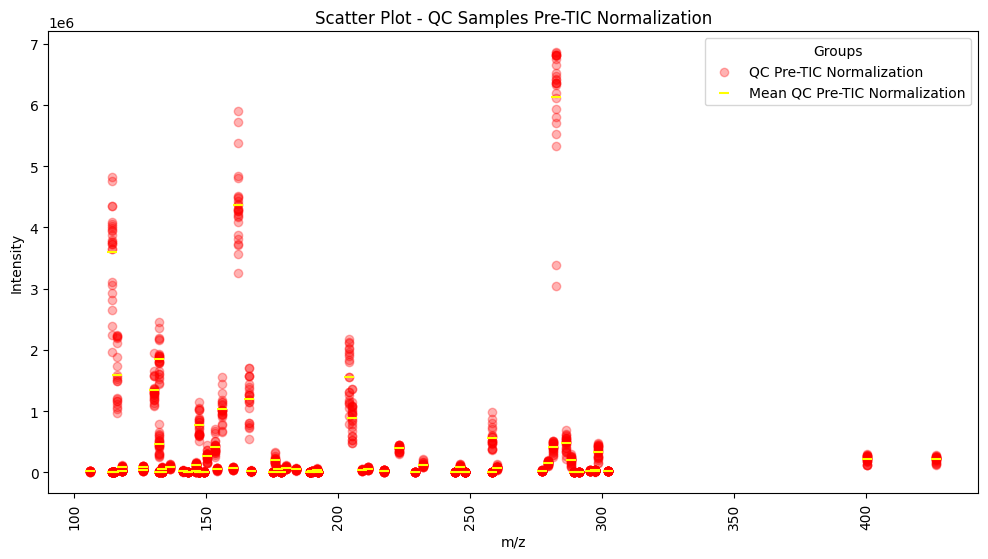

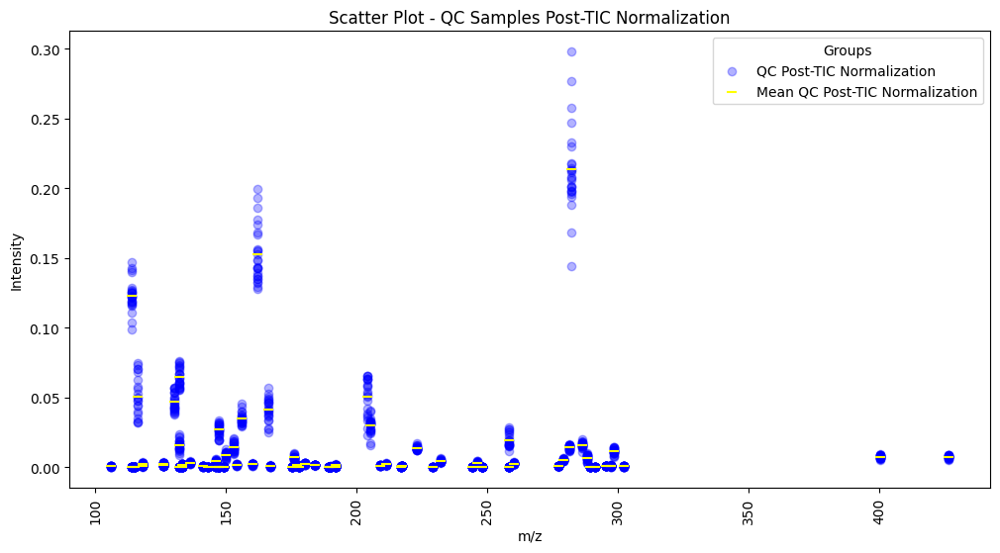

In [ ]:
''' SCATTER PLOT ONLY QC '''
# Pre-TIC normalization
qc_samples_pre = sample_names[group_labels == 'QC']
qc_data_pre = intensity_data.loc[qc_samples_pre]

# Post-TIC normalization
qc_samples_post = sample_names2[group_labels2 == 'QC']
qc_data_post = intensity_data2.loc[qc_samples_post]

''' SCATTER PLOT QC - PRE-TIC NORMALIZATION '''
plt.figure(figsize=(12, 6))
# Scatter plot QC pre-normalization
for sample in qc_data_pre.index:
    plt.scatter(mz_values_pos, qc_data_pre.loc[sample], alpha=0.3, color='red', label='QC Pre-TIC Normalization' if sample == qc_data_pre.index[0] else "")

# Mean QC pre-normalization
plt.scatter(mz_values_pos, mean_qc_pre.values, color='yellow', label='Mean QC Pre-TIC Normalization', s=50, marker='_')

plt.title("Scatter Plot - QC Samples Pre-TIC Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

''' SCATTER PLOT QC - POST-TIC NORMALIZATION '''
mean_qc_post = qc_data_post.iloc[1:].mean()

plt.figure(figsize=(12, 6))

# Scatter plot QC post-TIC normalization
for sample in qc_data_post.index:
    plt.scatter(mz_values_pos, qc_data_post.loc[sample], alpha=0.3, color='blue', label='QC Post-TIC Normalization' if sample == qc_data_post.index[0] else "")

# Mean QC post-TIC normalization
plt.scatter(mz_values_pos, mean_qc_post.values, color='yellow', label='Mean QC Post-TIC Normalization', s=50, marker='_')

plt.title("Scatter Plot - QC Samples Post-TIC Normalization")
plt.xlabel("m/z")
plt.ylabel("Intensity")
plt.xticks(rotation=90)
plt.legend(title="Groups")
plt.show()

## Imputation

In [ ]:
# AFTER NORMALIZATION, SUBSTITUTING MISSING VALUES WITH THE (MIN VALUE / 5) IN THE COLUMN (METABOLITES):

if 'm/z meas.' in df_pos_TIC_normalization.index:
  df_pos_TIC_normalization.drop('m/z meas.', inplace=True)
df_pos_TIC_norm = missing_values_substitution(df_pos_TIC_normalization)

if 'm/z meas.' in df_pos_pqn.index:
  df_pos_pqn.drop('m/z meas.', inplace=True)
df_pos_pqn_norm = missing_values_substitution(df_pos_pqn)

##Log transformation and autoscaling

In [ ]:
pos_log_transform = log_transform(df_pos_pqn_norm)
pos_log_transform

In [ ]:
pos_autoscaling = autoscaling(pos_log_transform)
pos_autoscaling

##PCA

In [ ]:
pca = PCA()
PCA.set_output(pca, transform="pandas")
df_pca_pos = pca.fit_transform(pos_autoscaling)
df_pca_pos

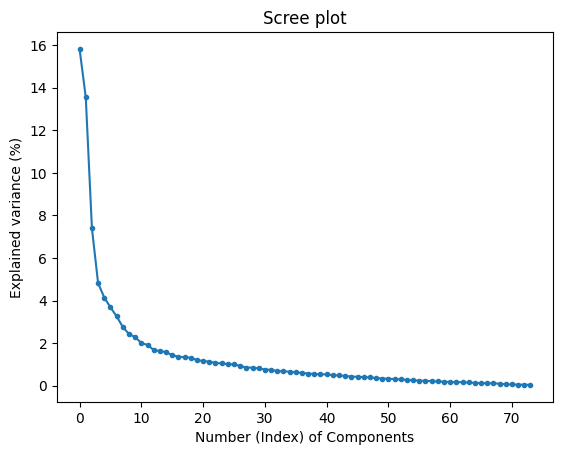

In [ ]:
plt.plot(pca.explained_variance_ratio_ * 100, '.-')
plt.title('Scree plot')
plt.xlabel('Number (Index) of Components')
plt.ylabel('Explained variance (%)')
plt.show()

37


<ipython-input-603-de1ec066329e>:7: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(cumulative_variance, 'o-', label='Cumulative explained variance', marker='.')


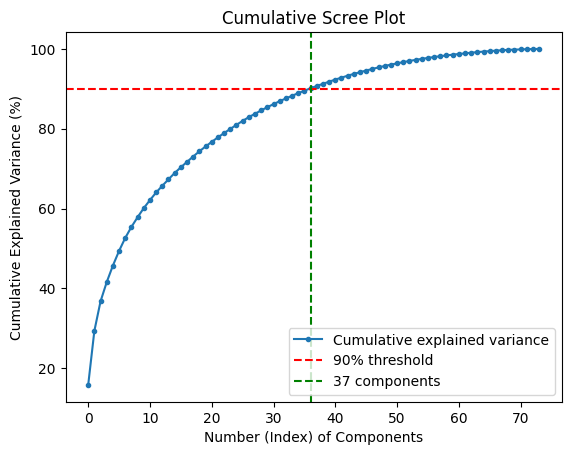

In [ ]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_) * 100

n_components = np.argmax(cumulative_variance >= 90) + 1
print(n_components)


plt.plot(cumulative_variance, 'o-', label='Cumulative explained variance', marker='.')
plt.axhline(y=90, color='r', linestyle='--', label='90% threshold')
plt.axvline(x=n_components-1, color='g', linestyle='--', label=f'{n_components} components')

plt.title('Cumulative Scree Plot')
plt.xlabel('Number (Index) of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.legend()
plt.show()

###PCA without QCs and with optimal number of components

In [ ]:
def group_samples(df: pd.DataFrame) -> pd.DataFrame:
  df = df.copy()
  df.loc[:, 'group'] = df.index.to_series().apply(lambda x: 'QC' if x.startswith('QC')
                                         else 'CHD' if x.startswith('CHD')
                                         else 'CTRL' if x.startswith('CTRL')
                                         else 'Other')
  return df

In [ ]:
df_positive_group = group_samples(pos_autoscaling)
df_positive_group = df_positive_group.groupby('group').apply(lambda x: x.drop('group', axis=1))

for i in df_positive_group.index.get_level_values(0):
  if i == 'QC':
    df_positive_group.drop(index=i, inplace=True, level=0)
pca = PCA(n_components=n_components)
PCA.set_output(pca, transform="pandas")
df_pca_pos = pca.fit_transform(df_positive_group)
df_pca_pos

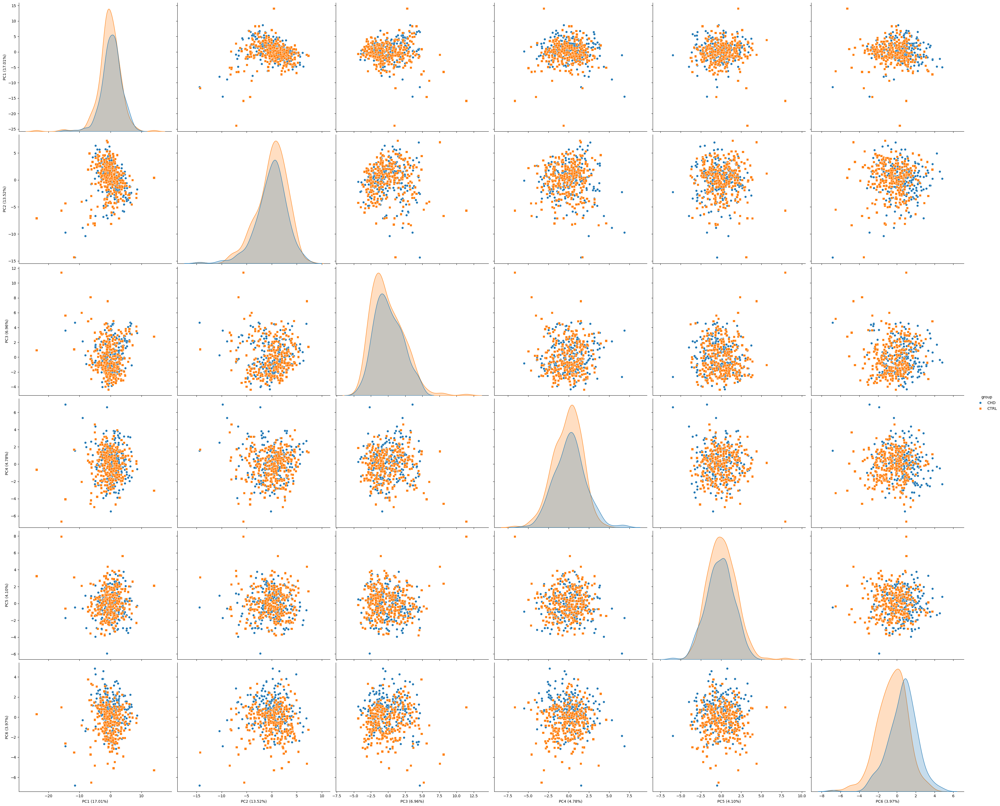

In [ ]:
import seaborn as sns

pca_pos_labels = [f"PC{i+1} ({pca.explained_variance_ratio_[i]*100:.2f}%)" for i in range(len(df_pca_pos.columns))]
df_pca_pos_sns = group_samples(df_pca_pos.reset_index(level=0).copy())
df_pca_pos_sns.rename(columns={f"pca{i}": pca_pos_labels[i] for i in range(len(pca_pos_labels))}, inplace=True)
sns.pairplot(
    df_pca_pos_sns,
    vars=pca_pos_labels[:6],
    hue='group',
    palette={'CHD': 'tab:blue', 'CTRL': 'tab:orange'},
    markers=['o', 's'],
    diag_kind="kde",
    height=5,
    aspect=1.2
)
plt.show()

In [ ]:
loadings_optimal = pd.DataFrame(pca.components_.T, columns=df_pca_pos.columns, index=pos_autoscaling.columns)
loadings_optimal

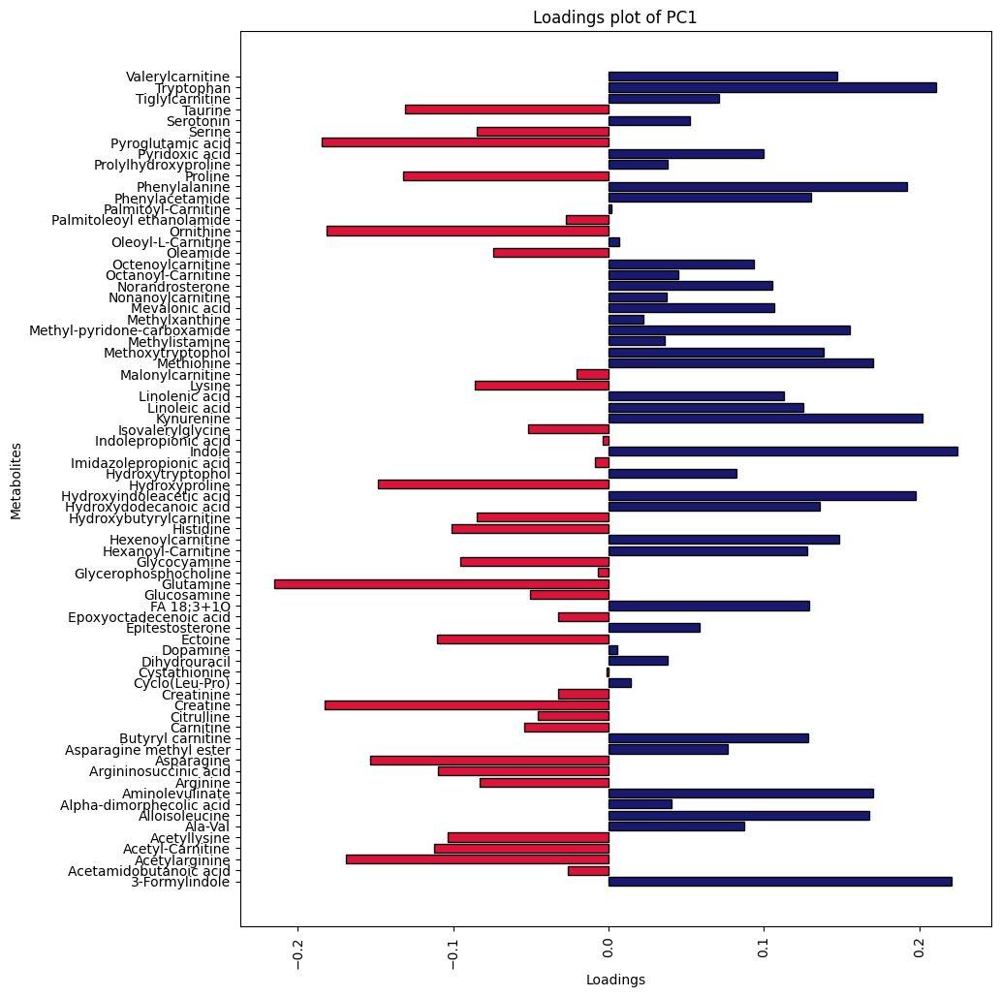

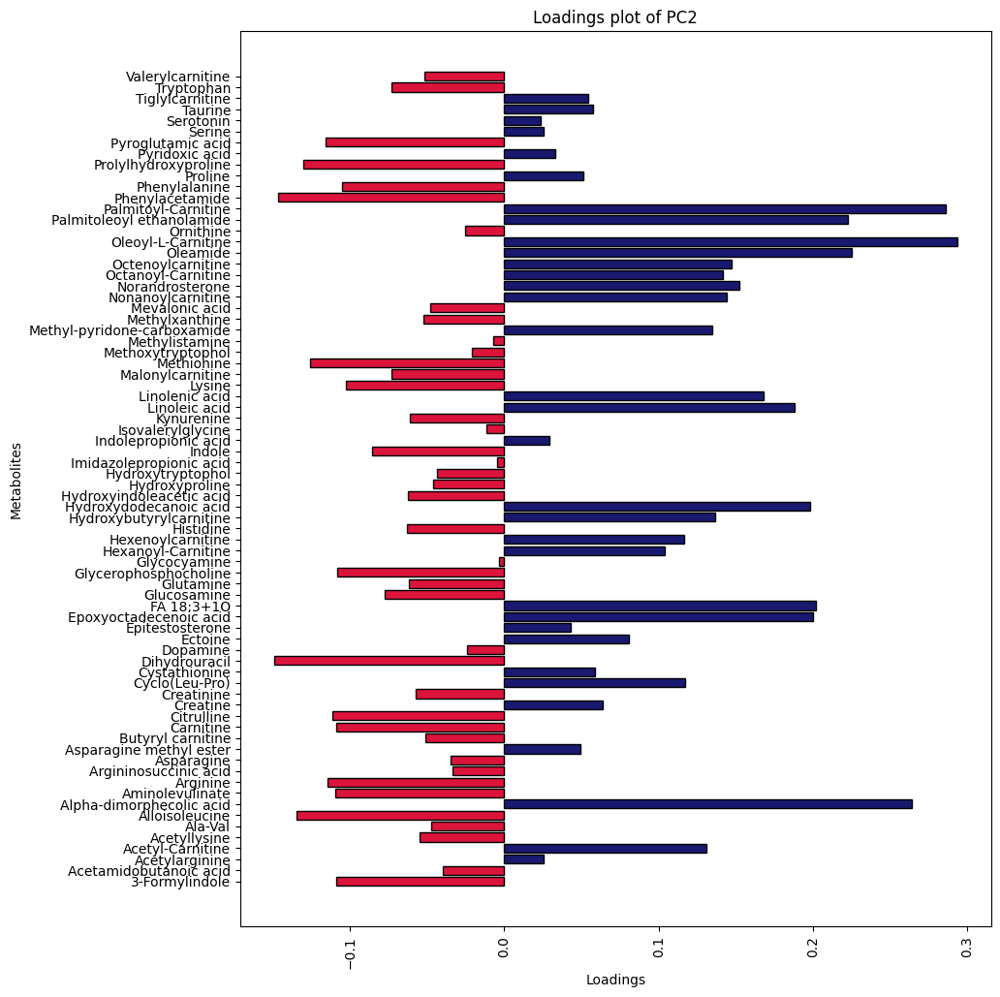

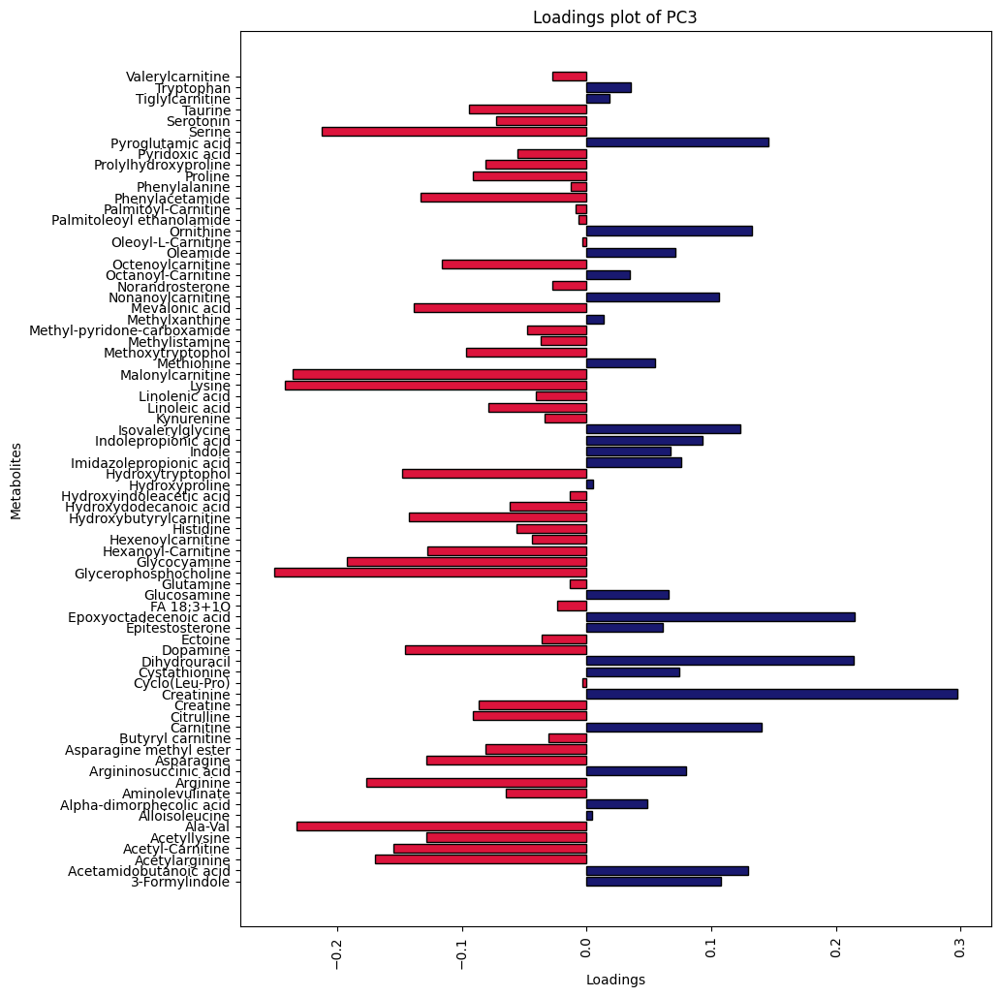

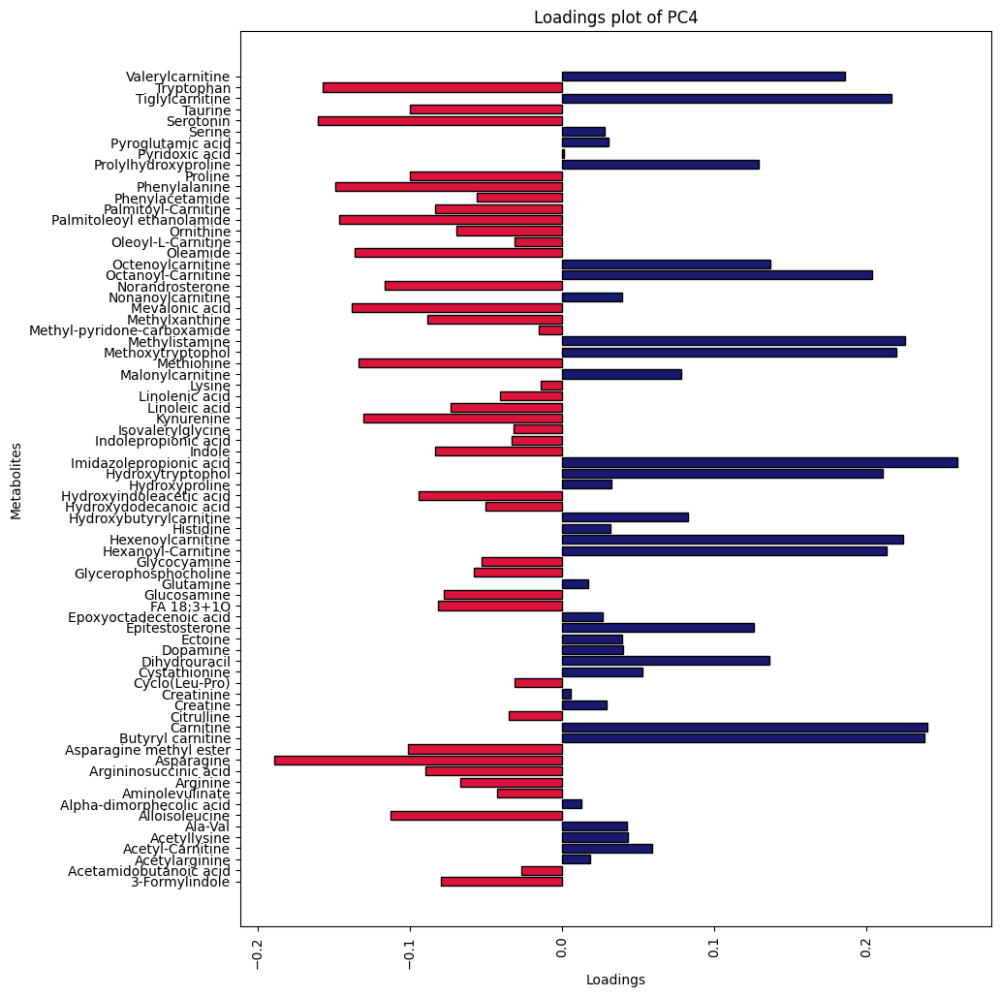

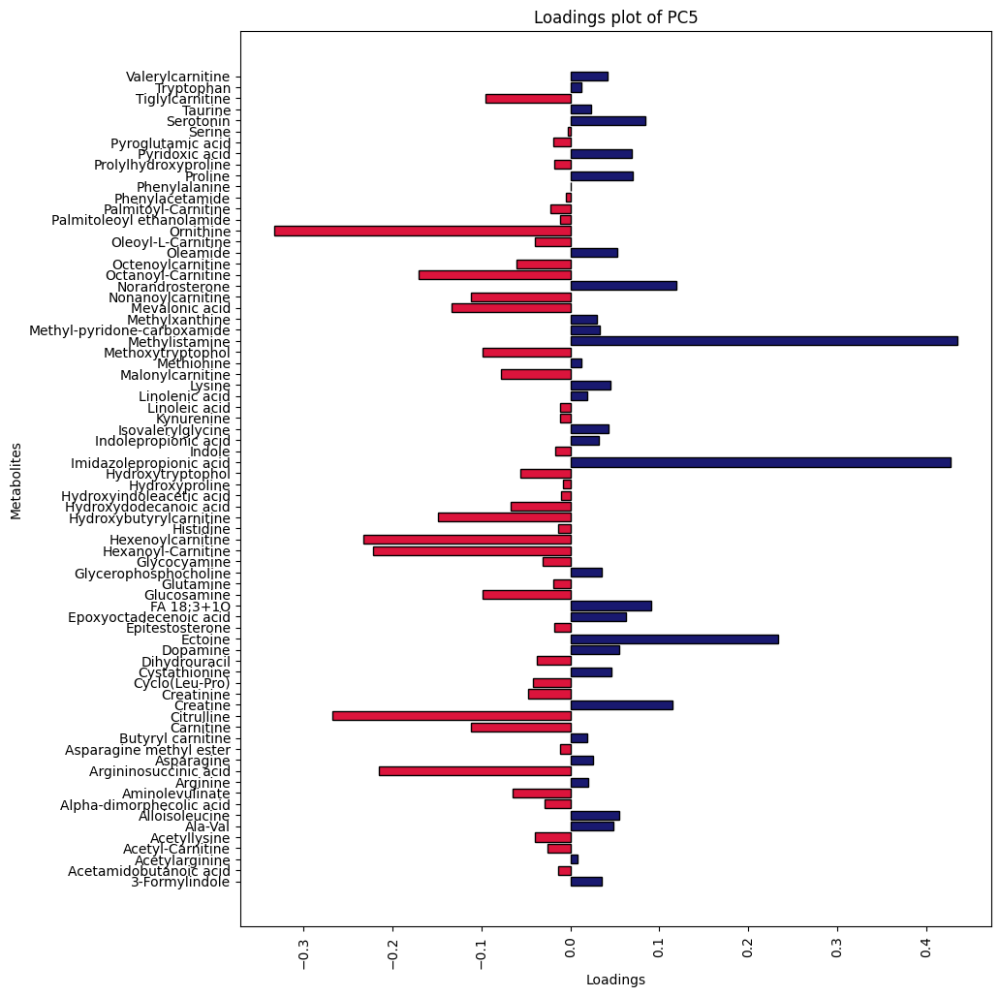

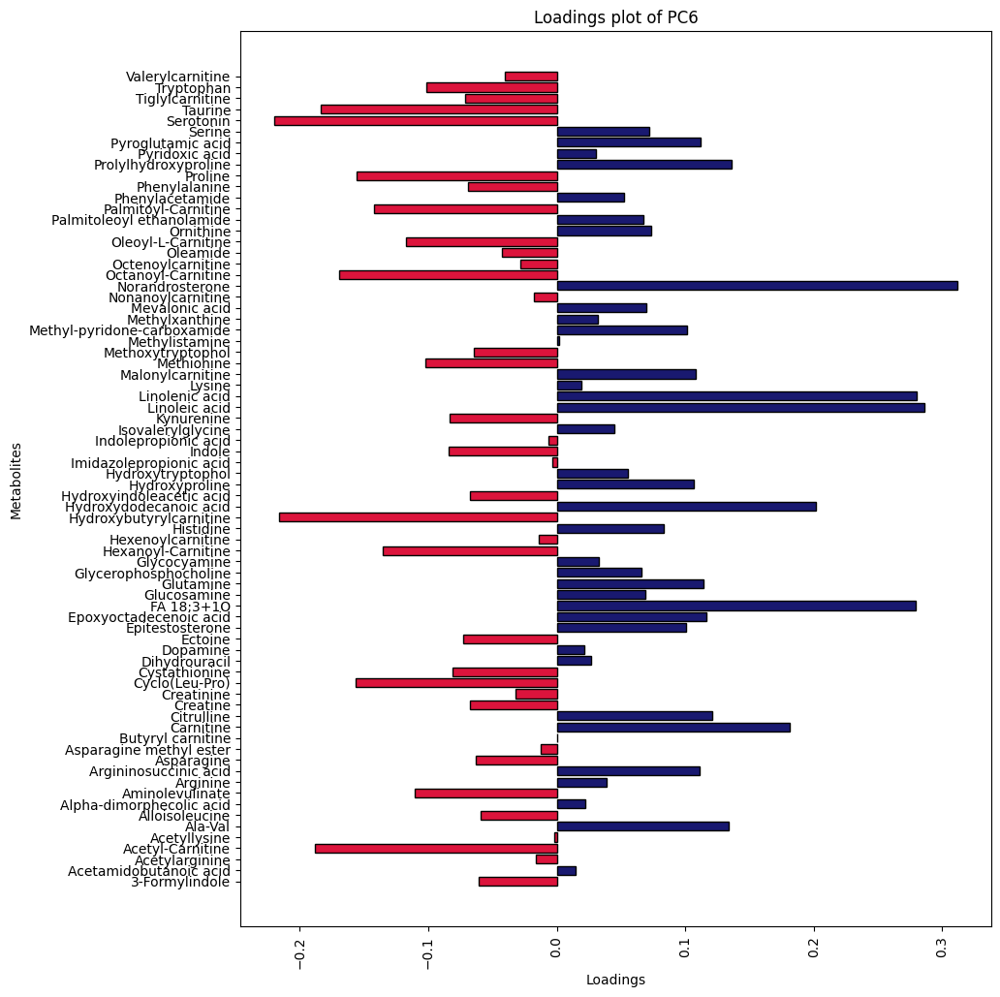

In [ ]:
rescale = lambda y: ('midnightblue' if y > 0 else 'crimson')
for i in range(6):
  plt.subplots(figsize=(10, 12))
  plt.xticks(rotation=90)
  plt.title(f"Loadings plot of PC{i+1}")
  plt.barh(pos_autoscaling.columns, loadings_optimal[f'pca{i}'].values, color=loadings_optimal[f'pca{i}'].apply(rescale), edgecolor='black')
  plt.ylabel("Metabolites")
  plt.xlabel("Loadings")
plt.show()

#MultiBlock - Low-Level Data Fusion

**In order to fuse the 2 datasets, it is necessary to remove QC samples, duplicates and perform again all pre-processing steps, that is why we started again from the original copy of the datasets.**

In [ ]:
df_neg_copy = df_neg.drop(index='m/z meas.')

df_neg_last_grouped=group_samples(df_neg_copy)
df_neg_last_no_qc = df_neg_last_grouped[~df_neg_last_grouped.index.str.startswith('QC')]
df_neg_last_no_qc['index_head'] = df_neg_last_no_qc.index.str[:9]

df_neg_last_no_duplicate = df_neg_last_no_qc[~df_neg_last_no_qc['index_head'].duplicated(keep='first')]
df_neg_last_no_duplicate = df_neg_last_no_duplicate.drop(columns=['index_head'])

df_last_pqn,_=PQN_normalization(df_neg_last_no_duplicate.drop(columns='group'))
df_last_imputeted=missing_values_substitution(df_last_pqn)
df_last_log_transform=log_transform(df_last_imputeted)
df_last_neg_autoscaling=autoscaling(df_last_log_transform)
pca_neg = PCA()
PCA.set_output(pca_neg, transform="pandas")
df_last_neg_pca = pca_neg.fit_transform(df_last_neg_autoscaling)
df_last_neg_autoscaling

In [ ]:
df_pos_copy = df_pos.drop(index='m/z meas.')

df_pos_last_grouped=group_samples(df_pos_copy)
df_pos_last_no_qc = df_pos_last_grouped[~df_pos_last_grouped.index.str.startswith('QC')]


df_pos_last_no_qc['index_head'] = df_pos_last_no_qc.index.str[:9]


df_pos_last_no_duplicate = df_pos_last_no_qc[~df_pos_last_no_qc['index_head'].duplicated(keep='first')]

df_pos_last_no_duplicate = df_pos_last_no_duplicate.drop(columns=['index_head'])

df_last_pqn,_=PQN_normalization(df_pos_last_no_duplicate.drop(columns='group'))
df_last_imputeted=missing_values_substitution(df_last_pqn)
df_last_log_transform=log_transform(df_last_imputeted)
df_last_pos_autoscaling=autoscaling(df_last_log_transform)
pca_pos = PCA()
PCA.set_output(pca_pos, transform="pandas")
df_last_pos_pca = pca_pos.fit_transform(df_last_pos_autoscaling)
df_last_pos_autoscaling

##PCA on negative dataset without QC samples and duplicates

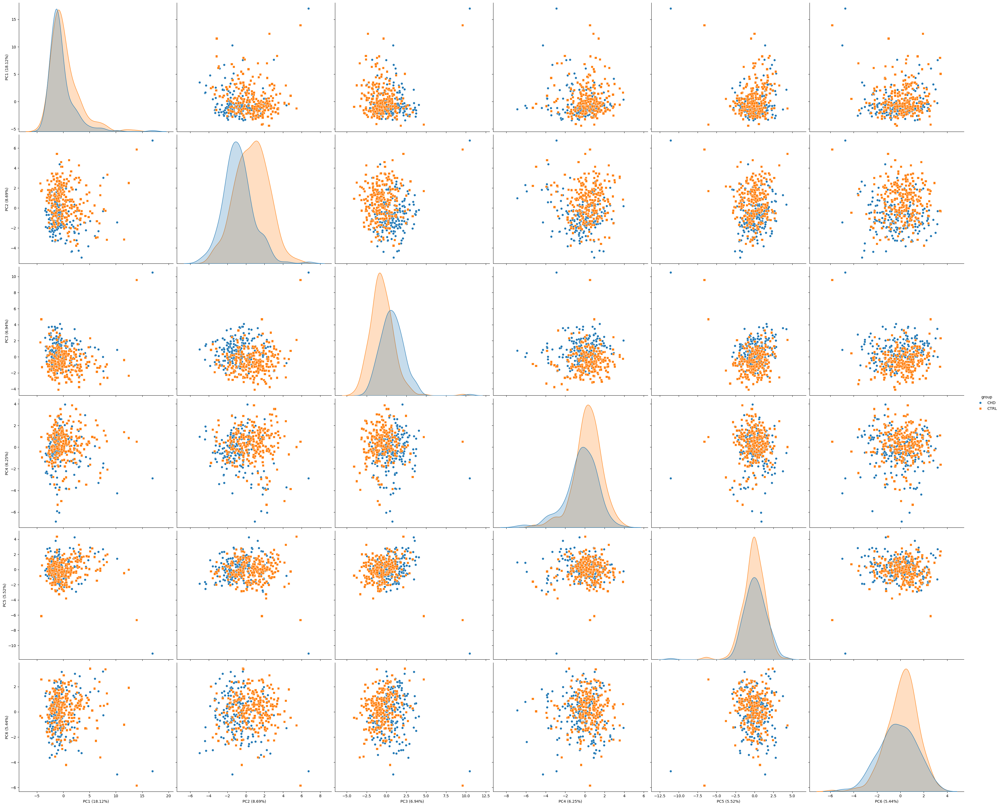

In [ ]:
import seaborn as sns
pca_last_labels = [f"PC{i+1} ({pca_neg.explained_variance_ratio_[i]*100:.2f}%)" for i in range(len(df_last_neg_pca.columns))]
df_pca_last_sns = group_samples(df_last_neg_pca.copy()).reset_index()

df_pca_last_sns.rename(columns={f"pca{i}": pca_last_labels[i] for i in range(len(pca_last_labels))}, inplace=True)
sns.pairplot(
    df_pca_last_sns,
    vars=pca_last_labels[:6],
    hue='group',
    palette={'CHD': 'tab:blue', 'CTRL': 'tab:orange'},
    markers=['o', 's'],
    diag_kind="kde",
    height=5,
    aspect=1.2
)
plt.show()

In [ ]:
loadings = pd.DataFrame(pca_neg.components_.T, columns=df_last_neg_pca.columns, index=df_last_neg_autoscaling.columns)
loadings

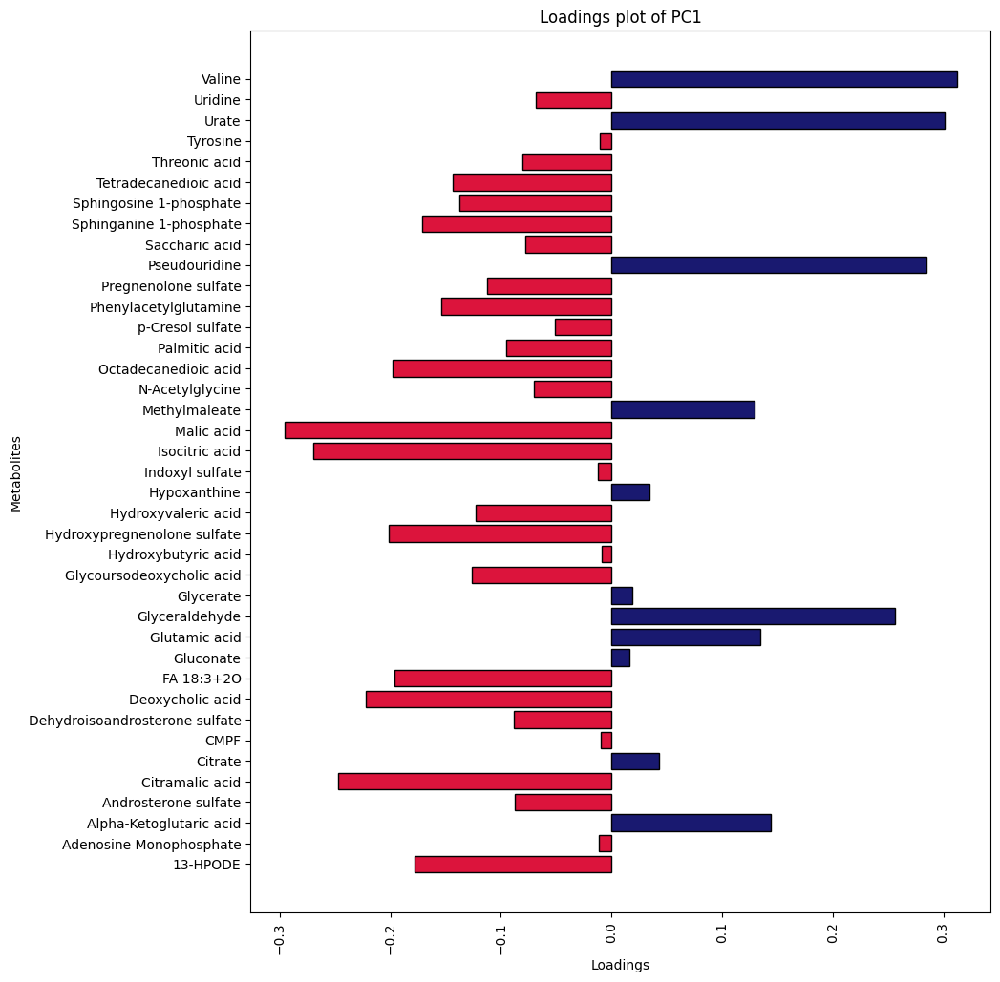

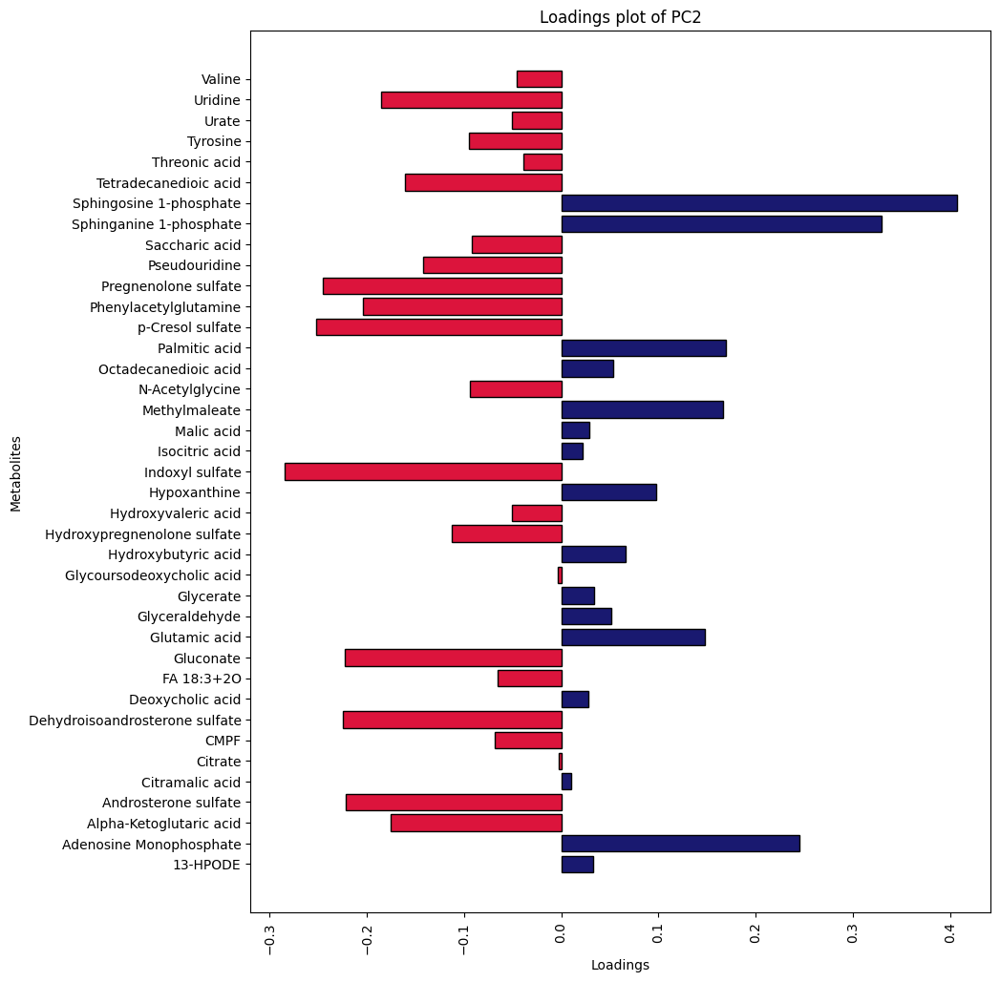

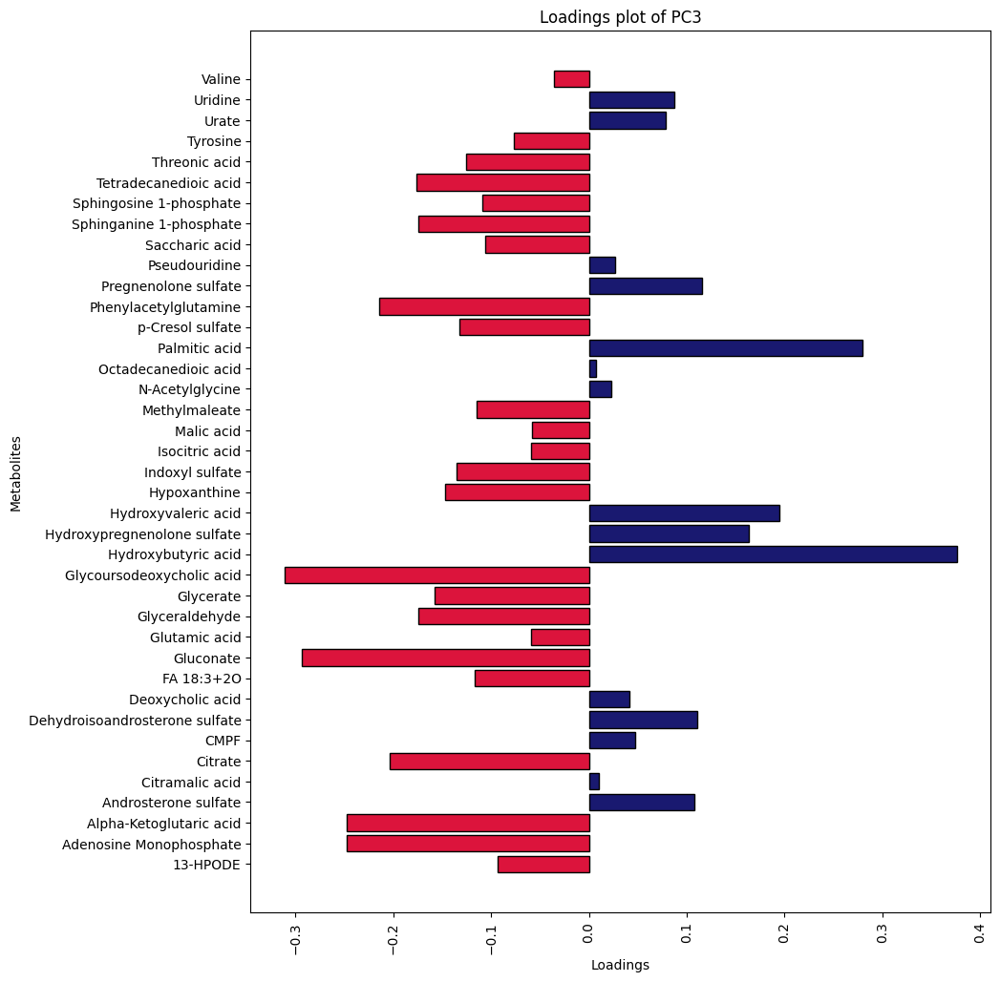

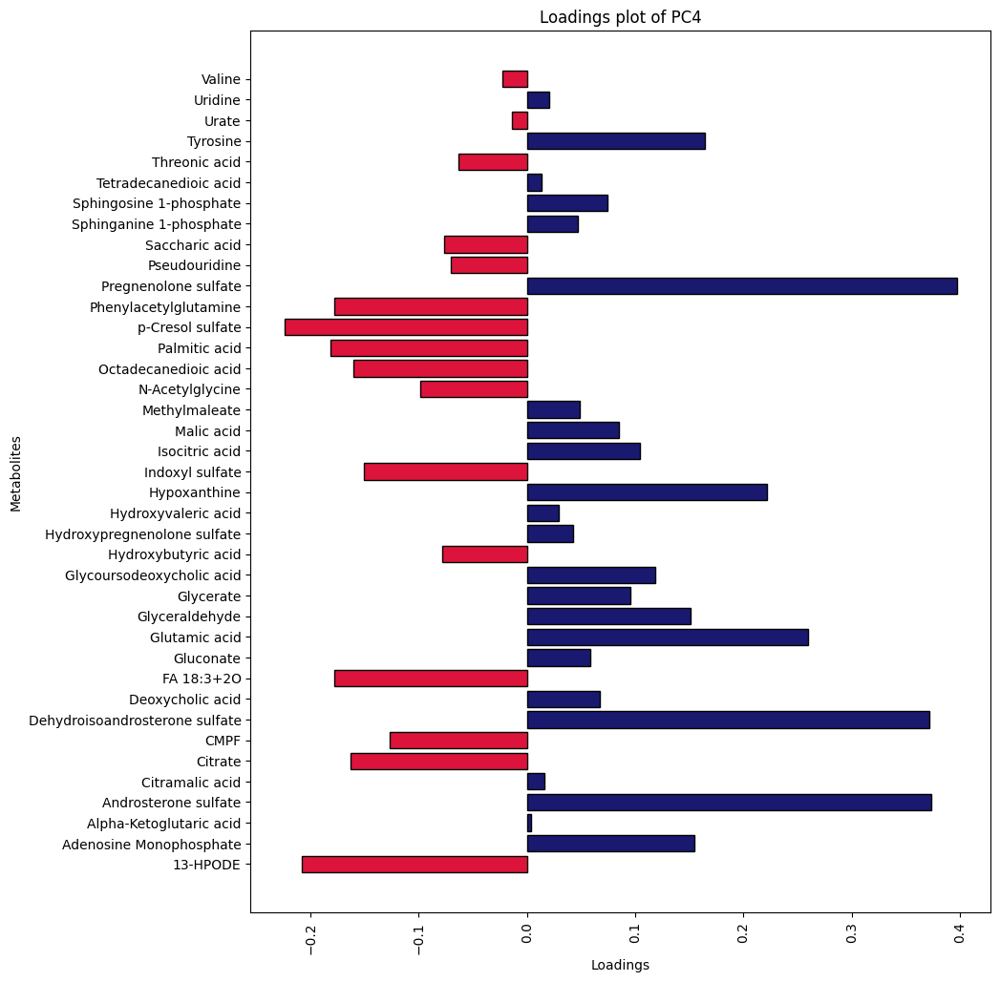

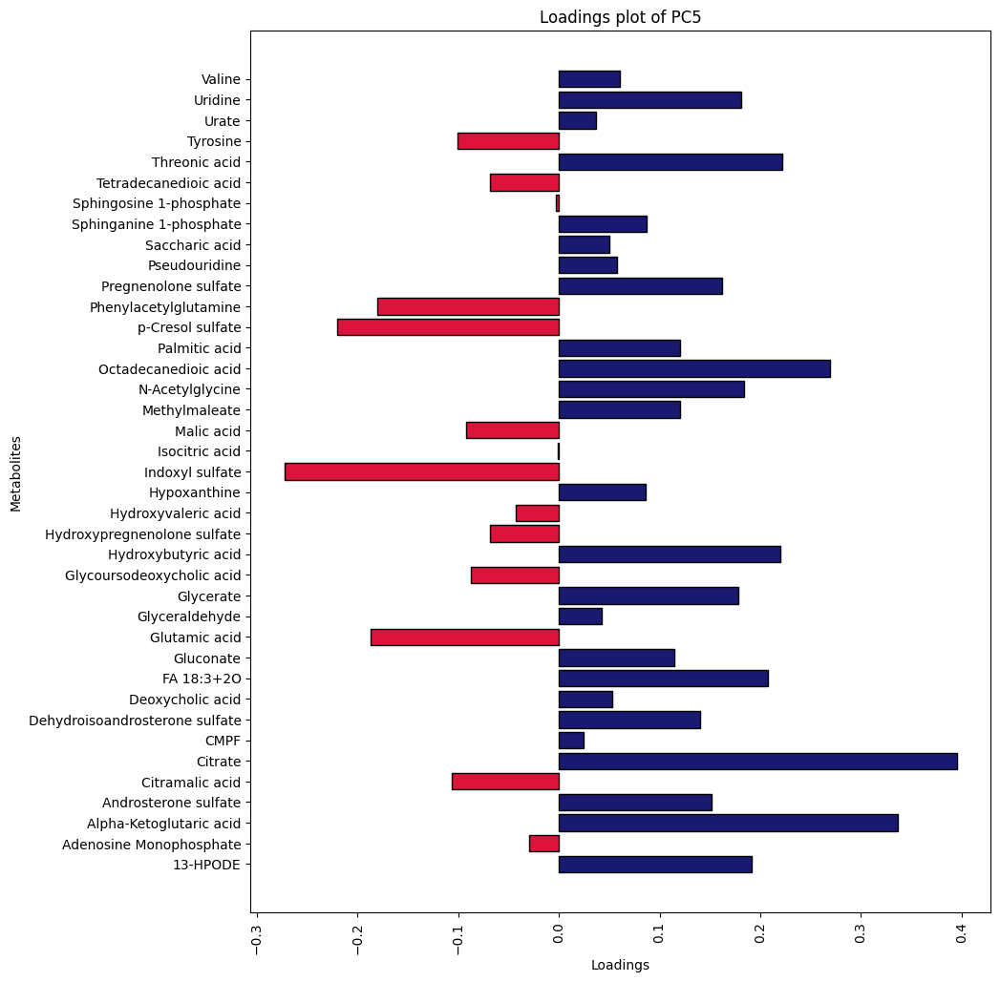

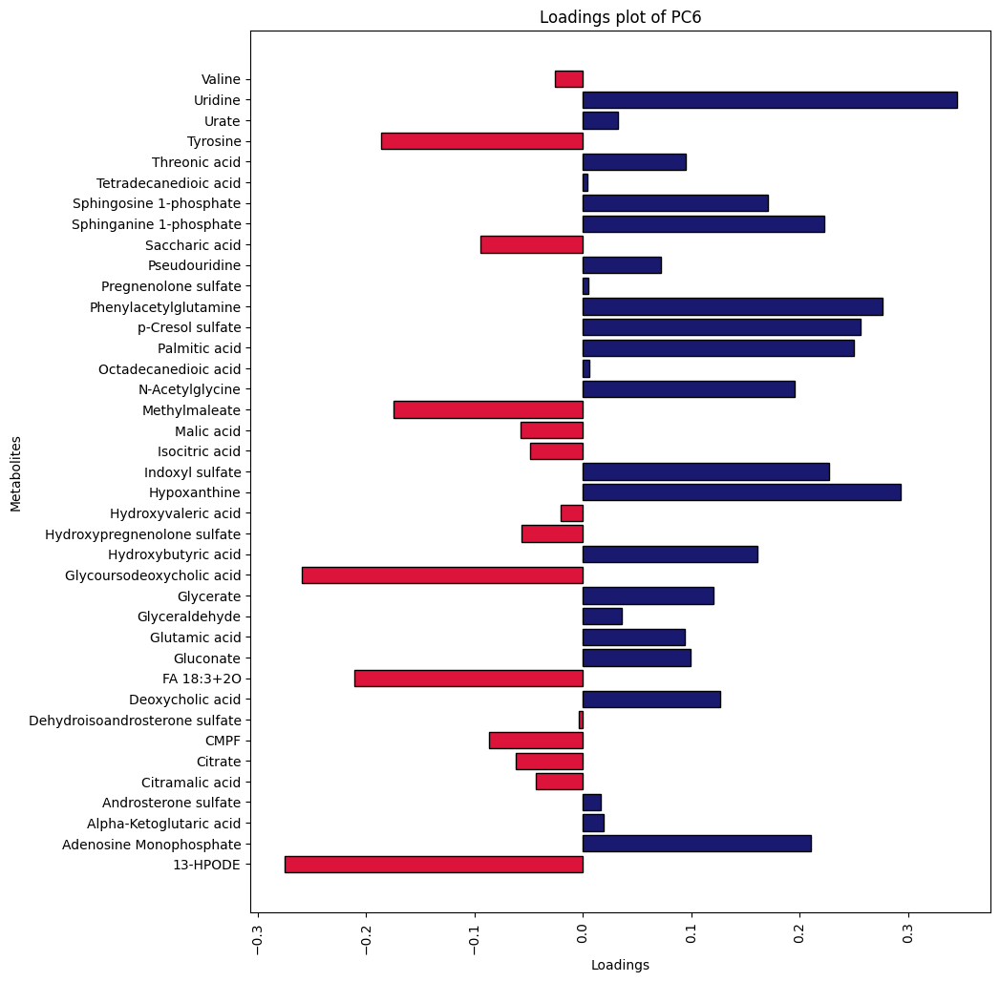

In [ ]:
rescale = lambda y: ('midnightblue' if y > 0 else 'crimson')
for i in range(6):
  plt.subplots(figsize=(10, 12))
  plt.xticks(rotation=90)
  plt.title(f"Loadings plot of PC{i+1}")
  plt.barh(df_last_neg_autoscaling.columns, loadings[f'pca{i}'].values, color=loadings[f'pca{i}'].apply(rescale), edgecolor='black')
  plt.ylabel("Metabolites")
  plt.xlabel("Loadings")
plt.show()

In [ ]:
#Renaming columns in order to fuse the two datasets
import re

df_last_neg_autoscaling.index = pd.Index([re.search(r'(.+?)_(\d+)', name).group(0)
                                       if re.search(r'(.+?)_(\d+)', name) else name
                                       for name in df_last_neg_autoscaling.index])
df_last_neg_autoscaling = df_last_neg_autoscaling.sort_index()


df_last_pos_autoscaling.index = pd.Index([re.search(r'(.+?)_(\d+)', name).group(0)
                                       if re.search(r'(.+?)_(\d+)', name) else name
                                       for name in df_last_pos_autoscaling.index])
df_last_pos_autoscaling = df_last_pos_autoscaling.sort_index()

indexDf = df_last_neg_autoscaling.index
new_index = []


## Frobenius norm

In [ ]:
from numpy.linalg import norm

frobenius_norm_neg = norm(df_last_neg_autoscaling, 'fro')
frobenius_norm_pos = norm(df_last_pos_autoscaling, 'fro')

normalized_neg = df_last_neg_autoscaling / frobenius_norm_neg
normalized_pos = df_last_pos_autoscaling / frobenius_norm_pos


fused_matrix = pd.concat([normalized_neg, normalized_pos], axis=1)

fused_matrix

##SUM-PCA

In [ ]:
pca = PCA()
PCA.set_output(pca, transform="pandas")
df_pca_combined = pca.fit_transform(fused_matrix)
df_pca_combined

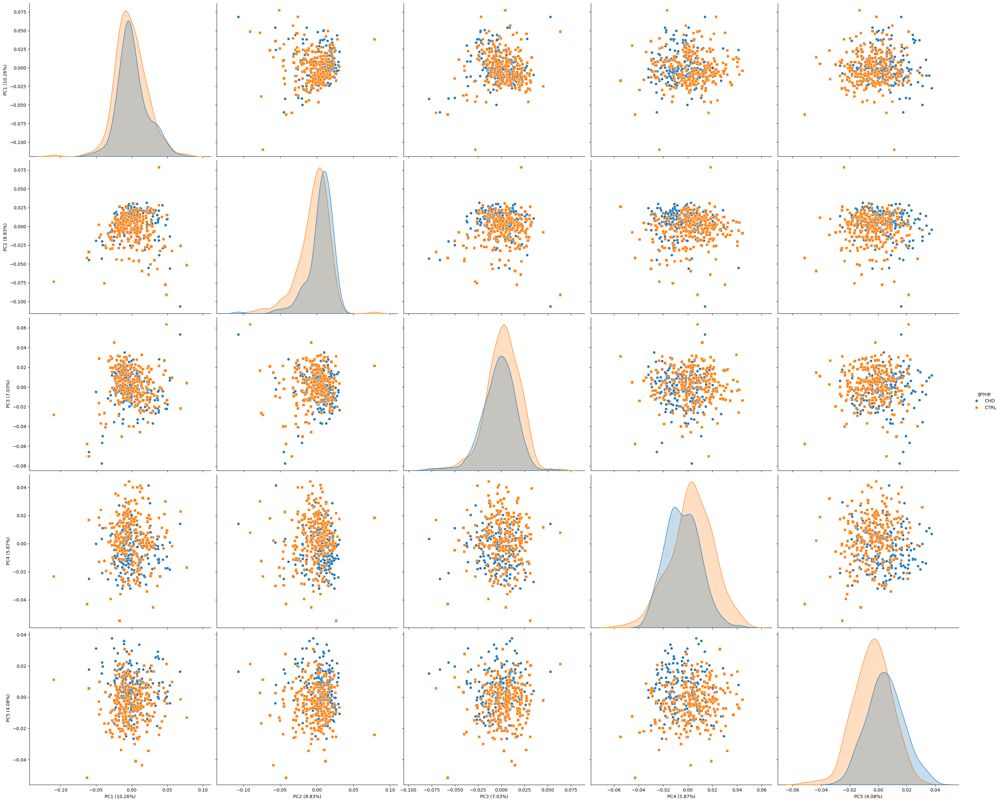

In [ ]:
pca_combined_labels = [f"PC{i+1} ({pca.explained_variance_ratio_[i]*100:.2f}%)" for i in range(len(df_pca_combined.columns))]

df_pca_combined_sns = group_samples(df_pca_combined.copy()).reset_index()

df_pca_combined_sns.rename(columns={f"pca{i}": pca_combined_labels[i] for i in range(len(pca_combined_labels))}, inplace=True)

sns.pairplot(
    df_pca_combined_sns,
    vars=pca_combined_labels[:5],
    hue='group',
    palette={'CHD': 'tab:blue', 'CTRL': 'tab:orange'},
    markers=['o', 's'],
    diag_kind="kde",
    height=5,
    aspect=1.2
)
plt.show()

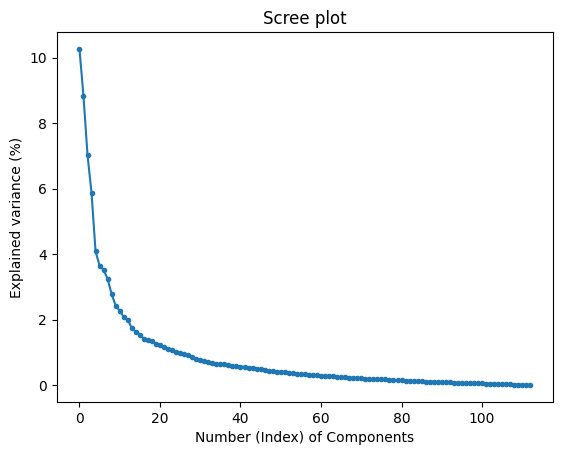

In [ ]:
plt.plot(pca.explained_variance_ratio_ * 100, '.-')
plt.title('Scree plot')
plt.xlabel('Number (Index) of Components')
plt.ylabel('Explained variance (%)')
plt.show()

In [ ]:

loading_combined = pd.DataFrame(pca.components_.T, columns=df_pca_combined.columns, index=fused_matrix.columns)

neg_cols = [col for col in loading_combined.index if col in df_neg.columns]
pos_cols = [col for col in loading_combined.index if col in df_pos.columns]

loading_summed = pd.DataFrame(index=['Negative', 'Positive'], columns=loading_combined.columns)

for pc in loading_combined.columns:
    loading_summed.loc['Negative', pc] = loading_combined.loc[neg_cols, pc].sum()
    loading_summed.loc['Positive', pc] = loading_combined.loc[pos_cols, pc].sum()

loading_summed

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,...,pca103,pca104,pca105,pca106,pca107,pca108,pca109,pca110,pca111,pca112
Negative,-0.860324,1.505362,-0.939528,-0.211468,-0.042921,0.195323,1.466464,2.679243,1.199727,-0.465304,...,0.092361,0.121042,0.024928,-0.333702,0.103582,-0.164375,0.09329,-0.039997,-0.010182,0.012384
Positive,0.674499,0.88165,1.384972,0.946653,0.475322,-0.943529,0.060085,2.069958,-2.13646,0.318893,...,0.080635,-0.116785,0.0274,0.2862,-0.362407,0.186424,-0.0107,-0.020825,-0.474335,0.215067


Block loadings plots

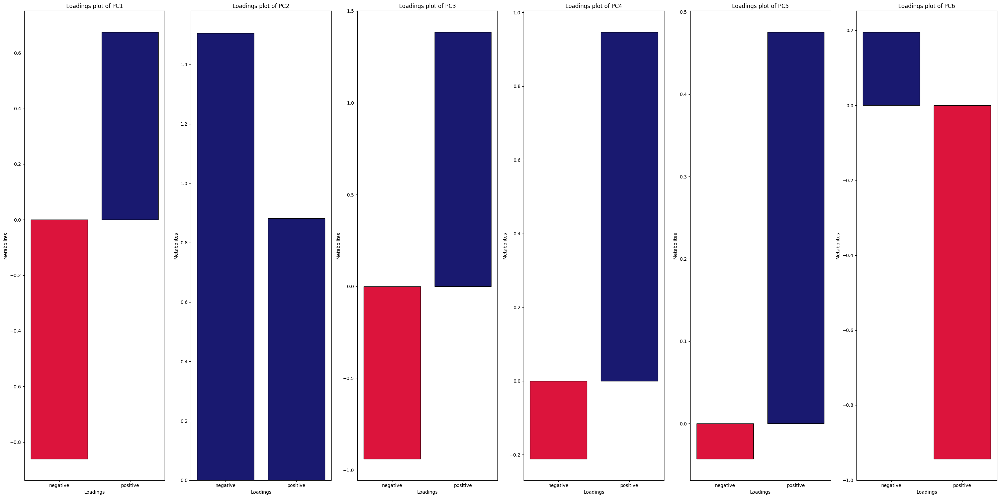

In [ ]:
import matplotlib.pyplot as plt

rescale = lambda y: ('midnightblue' if y > 0 else 'crimson')

fig, axes = plt.subplots(1, 6, figsize=(30, 15))  # 1 row, 6 columns of subplots

for i, ax in enumerate(axes):
  ax.set_title(f"Loadings plot of PC{i+1}")
  ax.bar(['negative','positive'], loading_summed[f'pca{i}'].values, color=loading_summed[f'pca{i}'].apply(rescale), edgecolor='black')
  ax.set_ylabel("Metabolites")
  ax.set_xlabel("Loadings")

plt.tight_layout()
plt.show()

##Anomaly detection


###Single PCA of CTRL and CHD groups

In [ ]:
X = fused_matrix

pca_chd=PCA()
pca_ctrl=PCA()
PCA.set_output(pca_chd, transform="pandas")
PCA.set_output(pca_ctrl, transform="pandas")
fused_groups=group_samples(fused_matrix.copy())

X_chd = fused_groups[fused_groups['group']=='CHD'].drop(columns='group')
X_ctrl = fused_groups[fused_groups['group']=='CTRL'].drop(columns='group')

df_pca_chd = pca_chd.fit_transform(X_chd)
df_pca_ctrl = pca_ctrl.fit_transform(X_ctrl)

42


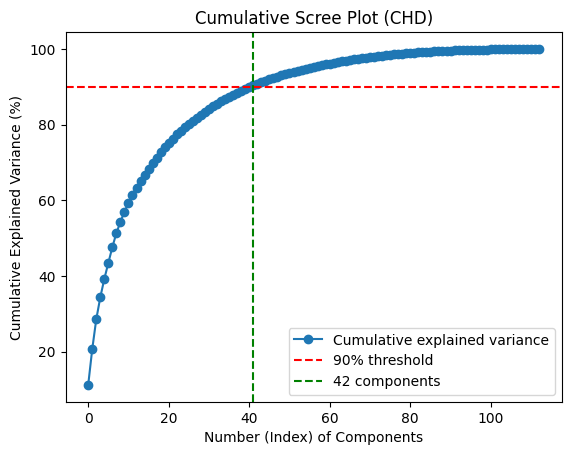

In [ ]:
cumulative_variance = np.cumsum(pca_chd.explained_variance_ratio_) * 100

n_components_90_chd = np.argmax(cumulative_variance >= 90) + 1
print(n_components_90_chd)


plt.plot(cumulative_variance, 'o-', label='Cumulative explained variance')
plt.axhline(y=90, color='r', linestyle='--', label='90% threshold')
plt.axvline(x=n_components_90_chd-1, color='g', linestyle='--', label=f'{n_components_90_chd} components')

plt.title('Cumulative Scree Plot (CHD)')
plt.xlabel('Number (Index) of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.legend()
plt.show()

25


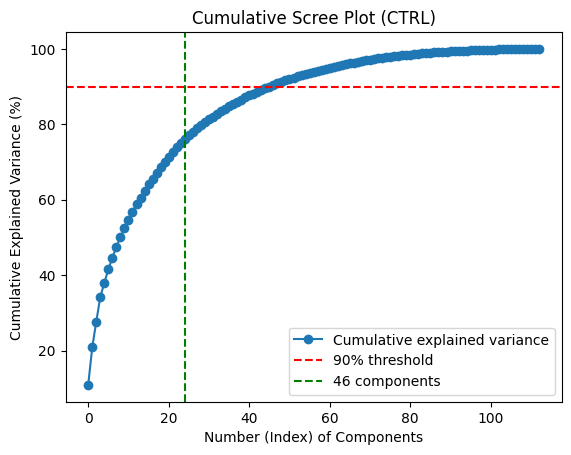

In [ ]:
cumulative_variance = np.cumsum(pca_ctrl.explained_variance_ratio_) * 100

n_components_90_ctrl = np.argmax(cumulative_variance >= 90) + 1
print(n_components_90)


plt.plot(cumulative_variance, 'o-', label='Cumulative explained variance')
plt.axhline(y=90, color='r', linestyle='--', label='90% threshold')
plt.axvline(x=n_components_90-1, color='g', linestyle='--', label=f'{n_components_90_ctrl} components')

plt.title('Cumulative Scree Plot (CTRL)')
plt.xlabel('Number (Index) of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.legend()
plt.show()

###Local Outlier Factor

In [ ]:
import numpy as np
from sklearn.neighbors import LocalOutlierFactor
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerPathCollection

outliers_chd = [f'pca{i}' for i in range(n_components_90_chd+1)]
X_chd_outliers = df_pca_chd[outliers_chd]

outliers_ctrl = [f'pca{i}' for i in range(n_components_90_ctrl+1)]
X_ctrl_outliers = df_pca_ctrl[outliers_ctrl]

def tune_lof_hyperparameter(data, n_neighbors):
    lof = LocalOutlierFactor(n_neighbors=n_neighbors, metric='euclidean', contamination=0.035)
    labels = lof.fit_predict(data)
    X_scores = lof.negative_outlier_factor_


    n_outliers = (labels == -1).sum()
    return labels, X_scores, n_outliers


labels_chd, X_scores_chd, n_outliers_chd = tune_lof_hyperparameter(X_chd_outliers, 7)

labels_ctrl, X_scores_ctrl, n_outliers_ctrl = tune_lof_hyperparameter(X_ctrl_outliers, 7)

outlier_indices_chd = labels_chd == -1
outlier_indices_ctrl = labels_ctrl == -1


print(f"Outliers detected in CHD dataset:")
outliers_chd2 = (X_chd_outliers[outlier_indices_chd]).index.tolist()
print(outliers_chd2)

print(f"\nOutliers detected in CTRL dataset:")
outliers_ctrl2 = X_ctrl_outliers[outlier_indices_ctrl].index.tolist()
print(outliers_ctrl2)

outliers_chd2.extend(outliers_ctrl2)
outliers = outliers_chd2

print(f"\nOutliers detected in all dataset:")
print(outliers)

Outliers detected in CHD dataset:
['CHD_133', 'CHD_141', 'CHD_144', 'CHD_16', 'CHD_17', 'CHD_179', 'CHD_5']

Outliers detected in CTRL dataset:
['CTRL01_19', 'CTRL01_30', 'CTRL01_41', 'CTRL01_43', 'CTRL21_11', 'CTRL31_11', 'CTRL31_33', 'CTRL41_02', 'CTRL41_08']

Outliers detected in all dataset:
['CHD_133', 'CHD_141', 'CHD_144', 'CHD_16', 'CHD_17', 'CHD_179', 'CHD_5', 'CTRL01_19', 'CTRL01_30', 'CTRL01_41', 'CTRL01_43', 'CTRL21_11', 'CTRL31_11', 'CTRL31_33', 'CTRL41_02', 'CTRL41_08']


LOF scores for CHD

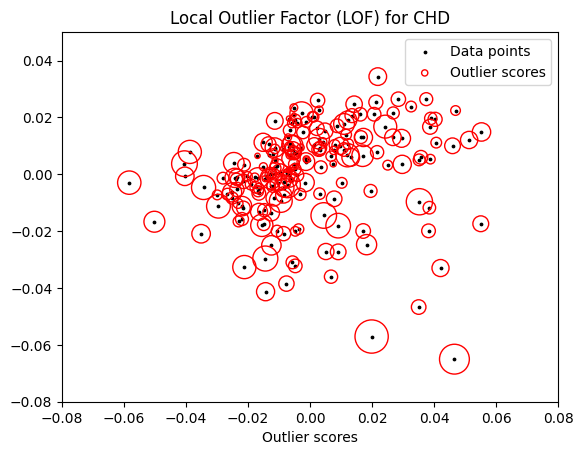

In [ ]:
#utility function to update legend marker size
def update_legend_marker_size(handle, orig):
    "Customize size of the legend marker"
    handle.update_from(orig)
    handle.set_sizes([20])


plt.scatter(X_chd_outliers.iloc[:, 0], X_chd_outliers.iloc[:, 1], color="k", s=3.0, label="Data points")
# plot circles with radius proportional to the outlier scores
radius = (X_scores_chd.max() - X_scores_chd) / (X_scores_chd.max() - X_scores_chd.min())
scatter = plt.scatter(
    X_chd_outliers.iloc[:, 0],
    X_chd_outliers.iloc[:, 1],
    s=1000 * radius,
    edgecolors="r",
    facecolors="none",
    label="Outlier scores",
)
plt.axis("tight")
plt.xlim((-0.08, 0.08))
plt.ylim((-0.08, 0.05))
plt.xlabel("Outlier scores")
plt.legend(
    handler_map={scatter: HandlerPathCollection(update_func=update_legend_marker_size)}
)
plt.title("Local Outlier Factor (LOF) for CHD")
plt.show()

LOF scores for CTRL

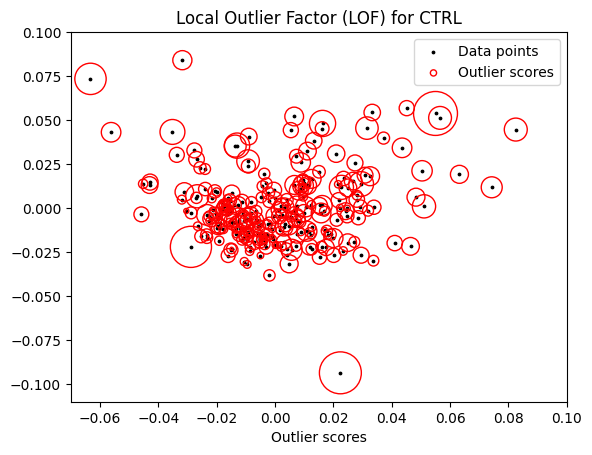

In [ ]:
plt.scatter(X_ctrl_outliers.iloc[:, 0], X_ctrl_outliers.iloc[:, 1], color="k", s=3.0, label="Data points")
# plot circles with radius proportional to the outlier scores
radius = (X_scores_ctrl.max() - X_scores_ctrl) / (X_scores_ctrl.max() - X_scores_ctrl.min())
scatter = plt.scatter(
    X_ctrl_outliers.iloc[:, 0],
    X_ctrl_outliers.iloc[:, 1],
    s=1000 * radius,
    edgecolors="r",
    facecolors="none",
    label="Outlier scores",
)
plt.axis("tight")
plt.xlim((-0.07, 0.1))
plt.ylim((-0.11, 0.1))
plt.xlabel("Outlier scores")
plt.legend(
    handler_map={scatter: HandlerPathCollection(update_func=update_legend_marker_size)}
)
plt.title("Local Outlier Factor (LOF) for CTRL")
plt.show()

##Features settings

If `features_selection=True` the feature selection won't be run, otherwise feature selection is run and the models will be trained on all features.

In [ ]:
features_selection=True
desired_columns =['Adenosine Monophosphate', 'Palmitoleoyl ethanolamide', 'Oleamide',
       'Epoxyoctadecenoic acid', 'Hydroxypregnenolone sulfate', 'Gluconate',
       'Hydroxydodecanoic acid', 'Glyceraldehyde', 'Uridine',
       'Glycoursodeoxycholic acid', 'Methylmaleate']

In these sections, all pre-processing steps are re-performed and the matrix is fused again, because of the deletion of outliers.

In [ ]:
df_neg_copy = df_neg.drop(index='m/z meas.')
if(features_selection): #only for features selection
  available_columns = df_neg_copy.columns.tolist()
  selected_columns = [col for col in desired_columns if col in available_columns]

  df_neg_copy = df_neg_copy.loc[:, selected_columns]

df_neg_copy.index = pd.Index([re.search(r'(.+?)_(\d+)', name).group(0)
                                       if re.search(r'(.+?)_(\d+)', name) else name
                                       for name in df_neg_copy.index])
df_neg_copy= df_neg_copy.sort_index()

indexDf = df_neg_copy.index

df_neg_copy = df_neg_copy.drop(index=outliers)

df_neg_last_grouped=group_samples(df_neg_copy)
df_neg_last_no_qc = df_neg_last_grouped[~df_neg_last_grouped.index.str.startswith('QC')]
df_neg_last_no_duplicate = df_neg_last_no_qc[~df_neg_last_no_qc.index.duplicated(keep='first')]


df_last_pqn,_=PQN_normalization(df_neg_last_no_duplicate.drop(columns='group'))
df_last_imputeted=missing_values_substitution(df_last_pqn)
df_last_log_transform=log_transform(df_last_imputeted)
df_last_neg_autoscaling_no_outliers=autoscaling(df_last_log_transform)

df_last_neg_autoscaling_no_outliers

In [ ]:
df_pos_copy = df_pos.drop(index='m/z meas.')
available_columns = df_pos_copy.columns.tolist()
if(features_selection):#only for features selection

  selected_columns = [col for col in desired_columns if col in available_columns]
  df_pos_copy = df_pos_copy.loc[:, selected_columns]

df_pos_copy.index = pd.Index([re.search(r'(.+?)_(\d+)', name).group(0)
                                       if re.search(r'(.+?)_(\d+)', name) else name
                                       for name in df_pos_copy.index])
df_pos_copy = df_pos_copy.sort_index()

filtered_df_pos_copy = df_pos_copy.drop(index=outliers)

df_pos_last_grouped = group_samples(filtered_df_pos_copy)
df_pos_last_no_qc = df_pos_last_grouped[~df_pos_last_grouped.index.str.startswith('QC')]
df_pos_last_no_duplicate = df_pos_last_no_qc[~df_pos_last_no_qc.index.duplicated(keep='first')]

df_last_pqn,_ = PQN_normalization(df_pos_last_no_duplicate.drop(columns='group'))
df_last_imputeted = missing_values_substitution(df_last_pqn)
df_last_log_transform = log_transform(df_last_imputeted)
df_last_pos_autoscaling_no_outliers = autoscaling(df_last_log_transform)
df_last_pos_autoscaling_no_outliers

In [ ]:
frobenius_norm_neg = norm(df_last_neg_autoscaling_no_outliers, 'fro')
frobenius_norm_pos = norm(df_last_pos_autoscaling_no_outliers, 'fro')

normalized_neg = df_last_neg_autoscaling_no_outliers / frobenius_norm_neg
normalized_pos = df_last_pos_autoscaling_no_outliers / frobenius_norm_pos

fused_matrix = pd.concat([normalized_neg, normalized_pos], axis=1)

fused_matrix

Correlation heatmap of selected features

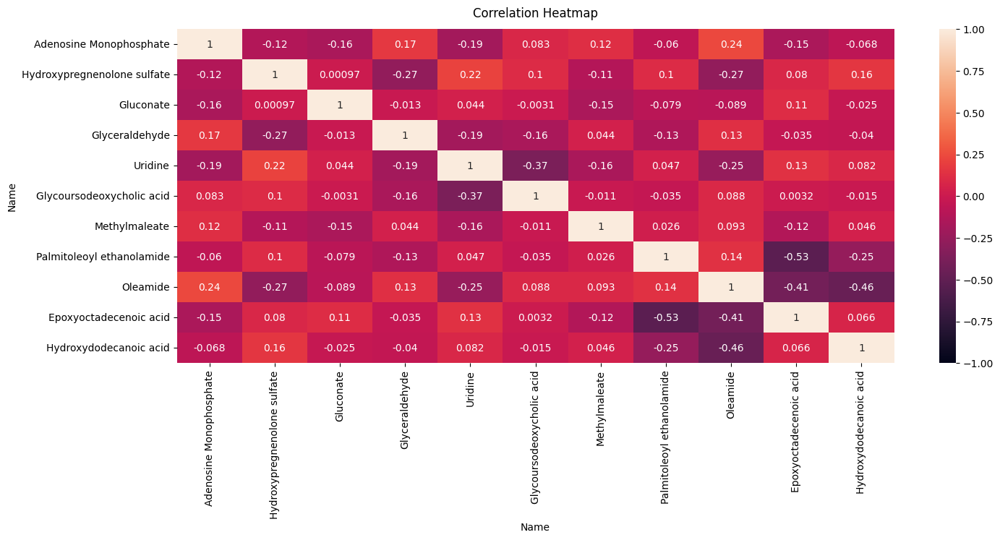

In [ ]:
plt.figure(figsize=(16, 6))

heatmap = sns.heatmap(fused_matrix.corr(), vmin=-1, vmax=1, annot=True)

heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

#Train/test split

Useful library to perform train/test split.

In [ ]:
!pip install kennard-stone

from kennard_stone import train_test_split

the data are split by applying the Kennard-Stone algorithm to the Principal Components of a single class within the fused dataset, using the kennard-stone Python library. After the initial split, 10% of the test set is randomly selected and swap with a random portion of the training set.

In [ ]:
from kennard_stone import train_test_split

X = fused_matrix
y = pd.Series(index=fused_matrix.index, dtype='int')
y[y.index.str.startswith('CHD')] = 1  # Positive samples
y[y.index.str.startswith('CTRL')] = 0  # Negative samples

pca_chd=PCA()
pca_ctrl=PCA()
pca_chd.set_output( transform="pandas")
pca_ctrl.set_output( transform="pandas")
fused_grouped=group_samples(fused_matrix.copy())

X_chd = fused_grouped[fused_grouped['group']=='CHD'].drop(columns='group')
X_ctrl = fused_grouped[fused_grouped['group']=='CTRL'].drop(columns='group')
y_chd = y[y.index.str.startswith('CHD')]
y_ctrl = y[y.index.str.startswith('CTRL')]


X_chd=pca_chd.fit_transform(X_chd)
X_ctrl=pca_ctrl.fit_transform(X_ctrl)


# Split data into training and testing sets
X_train_chd, X_test_chd, y_train_chd, y_test_chd = train_test_split(X_chd, y_chd, test_size=0.3)
X_train_ctrl, X_test_ctrl, y_train_ctrl, y_test_ctrl = train_test_split(X_ctrl, y_ctrl, test_size=0.3)

# Combine training and testing sets
X_train = pd.concat([X_train_chd, X_train_ctrl])
X_test = pd.concat([X_test_chd, X_test_ctrl])
y_train = pd.concat([y_train_chd, y_train_ctrl])
y_test = pd.concat([y_test_chd, y_test_ctrl])

print("Before swap:")
print("X_train size:", len(X_train))
print("X_test size:", len(X_test))
print("y_train size:", len(y_train))
print("y_test size:", len(y_test))

# --- Swap 20% of samples between train and test sets ---

# Calculate the number of samples to swap for each class
n_swap_chd = int(0.1 * len(X_test_chd))
n_swap_ctrl = int(0.1 * len(X_test_ctrl))

# Randomly select samples to swap for CHD
swap_idx_chd = np.random.choice(X_test_chd.index, size=n_swap_chd, replace=False)
swap_idx_chd_train = np.random.choice(X_train_chd.index, size=n_swap_chd, replace=False)
# Randomly select samples to swap for CTRL
swap_idx_ctrl = np.random.choice(X_test_ctrl.index, size=n_swap_ctrl, replace=False)
swap_idx_ctrl_train = np.random.choice(X_train_ctrl.index, size=n_swap_ctrl, replace=False)


X_train = pd.concat([X_train, X_test.loc[swap_idx_chd]])
X_test = X_test.drop(index=swap_idx_chd)
y_train = pd.concat([y_train, y_test.loc[swap_idx_chd]])
y_test = y_test.drop(index=swap_idx_chd)


X_train = pd.concat([X_train, X_test.loc[swap_idx_ctrl]])
X_test = X_test.drop(index=swap_idx_ctrl)
y_train = pd.concat([y_train, y_test.loc[swap_idx_ctrl]])
y_test = y_test.drop(index=swap_idx_ctrl)

X_test= pd.concat([X_test,X_train.loc[swap_idx_chd_train]])
X_train=X_train.drop(index=swap_idx_chd_train)
y_test=pd.concat([y_test,y_train.loc[swap_idx_chd_train]])
y_train=y_train.drop(index=swap_idx_chd_train)

X_test = pd.concat([X_test, X_train.loc[swap_idx_ctrl_train]])
X_train = X_train.drop(index=swap_idx_ctrl_train)
y_test = pd.concat([y_test, y_train.loc[swap_idx_ctrl_train]])
y_train = y_train.drop(index=swap_idx_ctrl_train)

print("\nAfter swap:")
print("X_train size:", len(X_train))
print("X_test size:", len(X_test))
print("y_train size:", len(y_train))
print("y_test size:", len(y_test))


X_test.index

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
2025-01-12 23:35:37,641 - kennard_stone.utils._pairwise:109[INFO] - Calculating pairwise distances using scikit-learn.

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
2025-01-12 23:35:37,648 - kennard_stone.utils._pairwise:109[INFO] - Calculating pairwise distances using scikit-learn.

/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.

Before swap:
X_train size: 297
X_test size: 129
y_train size: 297
y_test size: 129

After swap:
X_train size: 297
X_test size: 129
y_train size: 297
y_test size: 129


/usr/local/lib/python3.10/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Index(['CHD_90', 'CHD_73', 'CHD_189', 'CHD_112', 'CHD_69', 'CHD_61', 'CHD_130',
       'CHD_20', 'CHD_88', 'CHD_98',
       ...
       'CHD_111', 'CHD_182', 'CHD_2', 'CTRL31_17', 'CTRL21_68', 'CTRL01_09',
       'CTRL31_01', 'CTRL01_14', 'CTRL21_02', 'CTRL11_05'],
      dtype='object', length=129)

In [ ]:
df_raw_train_pos = df_pos_last_no_duplicate.loc[X_train.index].drop(columns='group')
df_raw_train_neg = df_neg_last_no_duplicate.loc[X_train.index].drop(columns='group')
print(X_test.index)

df_raw_test_pos = df_pos_last_no_duplicate.loc[X_test.index].drop(columns='group')
df_raw_test_neg = df_neg_last_no_duplicate.loc[X_test.index].drop(columns='group')

df_pqn_train_pos,reference_sample_pos = PQN_normalization(df_raw_train_pos)
df_pqn_train_neg,reference_sample_neg = PQN_normalization(df_raw_train_neg)

df_pqn_test_neg,_ = PQN_normalization(df_raw_test_neg,reference_sample_neg)
df_pqn_test_pos,_ = PQN_normalization(df_raw_test_pos,reference_sample_pos)

df_imputeted_train_pos = missing_values_substitution(df_pqn_train_pos)
df_imputeted_train_neg = missing_values_substitution(df_pqn_train_neg)

df_imputeted_test_pos = missing_values_substitution(df_pqn_test_pos)
df_imputeted_test_neg = missing_values_substitution(df_pqn_test_neg)

frobenius_norm_neg_raw = norm(df_imputeted_train_neg, 'fro')
frobenius_norm_pos_raw = norm(df_imputeted_train_pos, 'fro')


normalized_neg_train = df_imputeted_train_neg / frobenius_norm_neg_raw
normalized_pos_train = df_imputeted_train_pos / frobenius_norm_pos_raw

normalized_neg_test = df_imputeted_test_neg / frobenius_norm_neg_raw
normalized_pos_test = df_imputeted_test_pos / frobenius_norm_pos_raw

# Concatenate the normalized raw data
fused_matrix_raw = pd.concat([normalized_neg_train, normalized_pos_train], axis=1)
fused_matrix_log=log_transform(fused_matrix_raw)
X_train=autoscaling(fused_matrix_log)
fused_matrix_test_raw = pd.concat([normalized_neg_test, normalized_pos_test], axis=1)
fused_matrix_test_log=log_transform(fused_matrix_test_raw)
X_test=autoscaling_mean_std(fused_matrix_test_log,fused_matrix_log.mean(axis=0),fused_matrix_log.std(axis=0))

X_test
X_train

##(optional) Features selection with logistic regressor

 Forward stepwise selection starts with an empty model, iteratively adding features that provide the greatest improvement until no significant gains are achieved. Cross-validation determined the optimal number of features and validated the final model. A 5-fold cross-validation approach was used, and the best model was validated on the test set.

First selection: L1 ratio set to 0.7 to emphasize the Lasso component, improving feature selection by excluding highly correlated variables.

Second selection: L1 ratio set to 0.2 to reduce randomness in the Lasso term, stabilizing selection among correlated features.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold

if features_selection is False:
    num_features = X_train.shape[1]
    selected_features = []
    best_accuracy = 0
    best_model = None

    kf = KFold(n_splits=5)

    for _ in range(num_features):
        best_new_feature = None
        best_accuracy_with_new_feature = 0

        for feature in range(num_features):
            if feature not in selected_features:
                current_features = selected_features + [feature]

                # Use cross_val_score for more efficient cross-validation
                model = LogisticRegression(penalty='elasticnet',solver='saga',max_iter=1000,l1_ratio=0.7)
                scores = cross_val_score(model, X_train.iloc[:, current_features], y_train, cv=kf)
                accuracy = scores.mean()

                if accuracy > best_accuracy_with_new_feature:
                    best_accuracy_with_new_feature = accuracy
                    best_new_feature = feature

        if best_accuracy_with_new_feature > best_accuracy:
            selected_features.append(best_new_feature)
            best_accuracy = best_accuracy_with_new_feature

            # Train the best model on the full training set with selected features
            best_model = LogisticRegression(penalty='elasticnet',solver='saga',max_iter=1000,l1_ratio=0.7)
            best_model.fit(X_train.iloc[:, selected_features], y_train)
        else:
            break
    num_selected_features = len(selected_features)
    final_selected_features = []
    best_accuracy_final = 0
    final_model = None

    for i in range(num_selected_features):  # Iterate to select the fixed number of features
        best_feature_for_this_iteration = None
        best_accuracy_for_this_iteration = 0

        for feature in range(num_features):
            if feature not in final_selected_features:
                current_features = final_selected_features + [feature]

                model = LogisticRegression(penalty='elasticnet',solver='saga',max_iter=1000,l1_ratio=0.2)

                scores = cross_val_score(model, X_train.iloc[:, current_features], y_train, cv=kf)
                accuracy = scores.mean()

                if accuracy > best_accuracy_for_this_iteration:
                    best_accuracy_for_this_iteration = accuracy
                    best_feature_for_this_iteration = feature

        # Add the best feature for this iteration to the final selection
        final_selected_features.append(best_feature_for_this_iteration)

        # Update the best overall accuracy and model if improved
        if best_accuracy_for_this_iteration > best_accuracy_final:
            best_accuracy_final = best_accuracy_for_this_iteration
            final_model = LogisticRegression(penalty='elasticnet',solver='saga',max_iter=1000,l1_ratio=0.2)
            final_model.fit(X_train.iloc[:, final_selected_features], y_train)

    final_model.predict(X_test.loc[:, final_model.feature_names_in_])
    accuracy_score=final_model.score(X_test.loc[:, final_model.feature_names_in_], y_test)

    print("Final Selected Features:", final_selected_features)
    print("Best Model features",final_model.feature_names_in_)
    print("Final Model Accuracy on Test Set:", accuracy_score)
    print("rerun from outlier detection with features selection on True")

In [ ]:
if features_selection is False:
  feature_names = X_train.columns[final_selected_features]
  print("Final Selected Feature Names:", feature_names)

In [ ]:
print("Number of CHD samples in training set:", sum(y_train == 1))
print("Number of CTRL samples in training set:", sum(y_train == 0))

Number of CHD samples in training set: 128
Number of CTRL samples in training set: 169


##Random forest


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, KFold

rf_classifier = RandomForestClassifier(random_state=42,verbose =1, oob_score=True, warm_start=True, n_estimators=100, max_features='sqrt',criterion='gini',class_weight={0: 1, 1: 1.3})
kf = KFold(n_splits=5, shuffle=True, random_state=42)

scores = cross_val_score(rf_classifier, X_train, y_train, cv=kf, scoring='accuracy')

print("Cross-Validation Accuracy Scores:", scores)
print("Mean Accuracy:", np.mean(scores))
print("Standard Deviation of Accuracy:", np.std(scores))


rf_classifier.fit(X_train, y_train)

from sklearn.metrics import accuracy_score,recall_score
y_pred = rf_classifier.predict(X_test)
print("Oob Score",rf_classifier.oob_score_)
test_accuracy = accuracy_score(y_test, y_pred)
test_sensitivity = recall_score(y_test, y_pred)
print("Test Accuracy:", test_accuracy)
print("Test sensitivity", test_sensitivity)
train_accuracy = accuracy_score(y_train, rf_classifier.predict(X_train))
print("Train Accuracy:", train_accuracy)

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


Cross-Validation Accuracy Scores: [0.93333333 0.9        0.93220339 0.93220339 0.89830508]
Mean Accuracy: 0.9192090395480227
Standard Deviation of Accuracy: 0.016390024284265503


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


Oob Score 0.9158249158249159
Test Accuracy: 0.9844961240310077
Test sensitivity 0.9642857142857143
Train Accuracy: 1.0


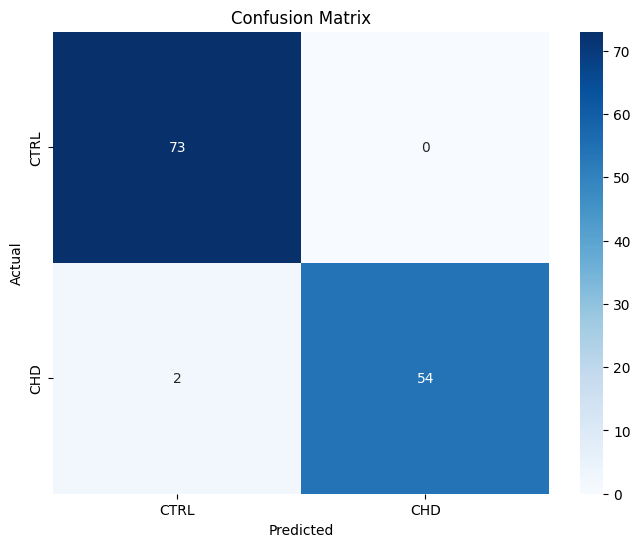

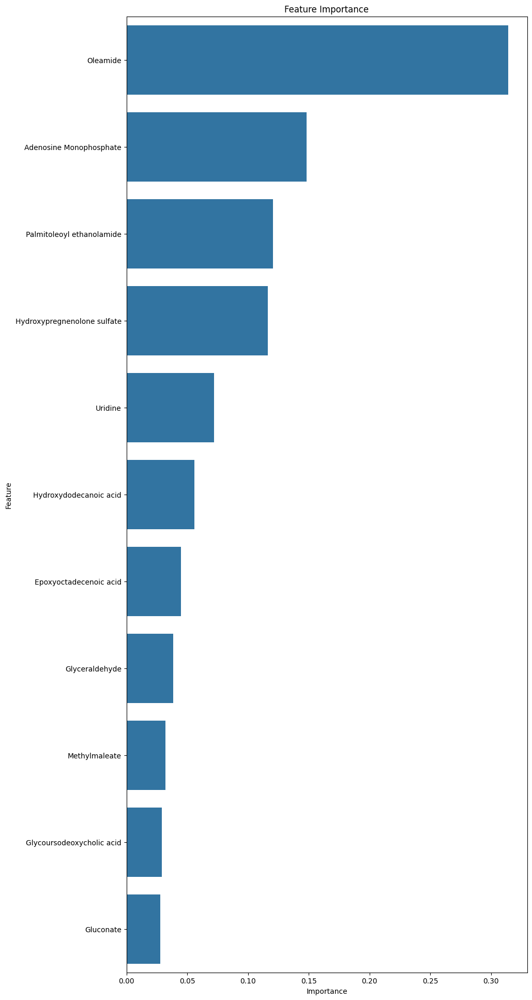

['Oleamide',
 'Adenosine Monophosphate',
 'Palmitoleoyl ethanolamide',
 'Hydroxypregnenolone sulfate',
 'Uridine',
 'Hydroxydodecanoic acid',
 'Epoxyoctadecenoic acid',
 'Glyceraldehyde',
 'Methylmaleate',
 'Glycoursodeoxycholic acid',
 'Gluconate']

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=['CTRL', 'CHD'], yticklabels=['CTRL', 'CHD'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

feature_importances = rf_classifier.feature_importances_
feature_names = X_train.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 24))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()
importance_df.iloc[:30].iloc[:,0].to_list()

In [ ]:
# Calculate Test Sensitivity (Recall)
test_sensitivity = recall_score(y_test, y_pred)
print("Test Sensitivity:", test_sensitivity)

# Calculate Test Specificity
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
test_specificity = tn / (tn + fp)
print("Test Specificity:", test_specificity)

Test Sensitivity: 0.9642857142857143
Test Specificity: 1.0


##SVM with RBF kernel

To optimize the hyperparameters of the Support Vector Machine (SVM) classifier with an RBF kernel, Repeated K-Fold Cross-Validation was used. The dataset was split into 5 folds, and the process was repeated 3 times to ensure stable results and reduce overfitting.

The key hyperparameters tuned were:

C: Controls the trade-off between minimizing error on training data and maintaining a simple decision boundary, inversely related to the slack budget.
Gamma: The kernel coefficient for the RBF kernel, determining the model's ability to generalize.

Best C: 1
Best Gamma: 0.1
Best Score: 0.9317137476459509
Cross-Validation Mean Accuracy Scores: [0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


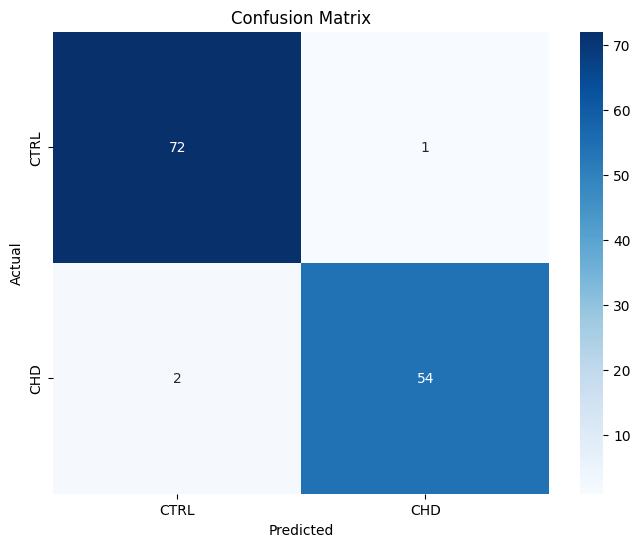

In [ ]:
from sklearn.model_selection import RepeatedKFold, cross_val_score
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

gamma_validation = [0.001, 0.005,0.006,0.007,0.008,0.009, 0.01,0.02,0.03,0.04, 0.05,0.06,0.07,0.08,0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

C_validation = [0.001,0.01,0.1,1,10,100]
best_score = 0
best_gamma = None
value_validation = []
best_c = None


rkf = RepeatedKFold(n_splits=5, n_repeats=3,random_state=41100)

for c in C_validation:
  for gamma in gamma_validation:
      svm_classifier = SVC(kernel='rbf',gamma=gamma,C=c)
      scores = cross_val_score(svm_classifier, X_train, y_train, cv=rkf, scoring='accuracy')
      mean_accuracy = np.mean(scores)
      value_validation.append(mean_accuracy)

      if mean_accuracy > best_score:
          best_score = mean_accuracy
          best_gamma = gamma
          best_c = c
print("Best C:", best_c)
print("Best Gamma:", best_gamma)
print("Best Score:", best_score)
print("Cross-Validation Mean Accuracy Scores:", value_validation)


best_svm_classifier = SVC(kernel='rbf',gamma=best_gamma,C=best_c)
best_svm_classifier.fit(X_train, y_train)

y_pred = best_svm_classifier.predict(X_test)

test_accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", test_accuracy)
train_accuracy = accuracy_score(y_train, rf_classifier.predict(X_train))
print("Train Accuracy:", train_accuracy)
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=['CTRL', 'CHD'], yticklabels=['CTRL', 'CHD'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
# Calculate Test Sensitivity (Recall)
test_sensitivity = recall_score(y_test, y_pred)
print("Test Sensitivity:", test_sensitivity)

# Calculate Test Specificity
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
test_specificity = tn / (tn + fp)
print("Test Specificity:", test_specificity)

Test Sensitivity: 0.9642857142857143
Test Specificity: 0.9863013698630136


[[0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576], [0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.5689830508474576, 0.56898305084745

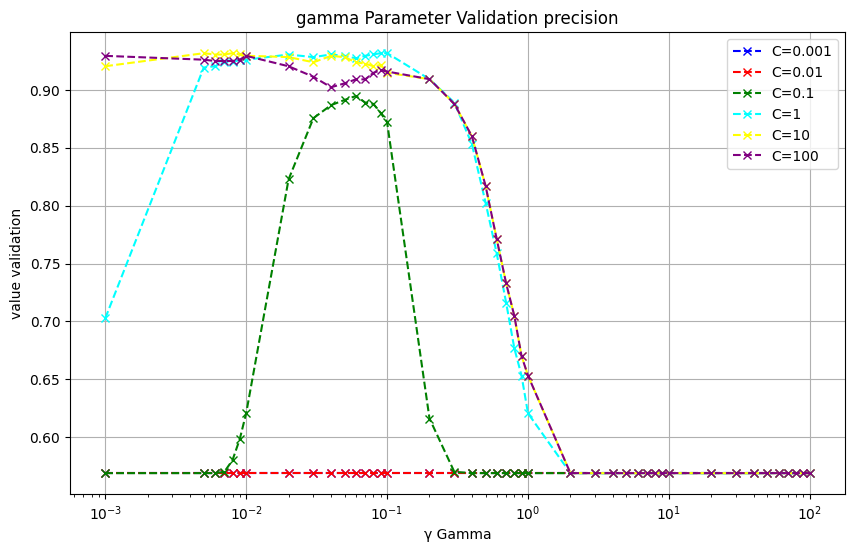

In [ ]:
from itertools import islice
it = iter(value_validation)
sottoliste = [list(islice(it, len(gamma_validation))) for _ in range(0, len(value_validation), len(gamma_validation))]
print(sottoliste)
plt.figure(figsize=(10, 6))
plt.plot(gamma_validation, sottoliste[0], label="C=0.001", color="blue", linestyle="--", marker="x")
plt.plot(gamma_validation, sottoliste[1], label="C=0.01", color="red", linestyle="--", marker="x")
plt.plot(gamma_validation, sottoliste[2], label="C=0.1", color="green", linestyle="--", marker="x")
plt.plot(gamma_validation, sottoliste[3], label="C=1", color="cyan", linestyle="--", marker="x")
plt.plot(gamma_validation, sottoliste[4], label="C=10", color="yellow", linestyle="--", marker="x")
plt.plot(gamma_validation, sottoliste[5], label="C=100", color="purple", linestyle="--", marker="x")
plt.xlabel("γ Gamma")
plt.ylabel("value validation")
plt.legend()
plt.title("gamma Parameter Validation precision")
plt.xscale('log')
plt.grid(True)
plt.show()

##SVM with linear kernel

A similar approach was used to set the regularization parameter C for the Support Vector Machine with a linear kernel.
The performance was validated using 5-fold cross-validation without repetition, and the model's performance was evaluated based on the mean accuracy across the folds.

Best C: 0.03
Best Score: 0.9327306967984935
Cross-Validation Mean Accuracy Scores: [0.908060263653484, 0.9203389830508474, 0.922598870056497, 0.9237288135593219, 0.9248587570621467, 0.9237476459510356, 0.9237476459510356, 0.9259887005649716, 0.9327306967984935, 0.9293785310734463, 0.9305084745762712, 0.9305084745762712, 0.9316195856873822, 0.9304896421845574, 0.9304896421845574, 0.9293596986817326, 0.9259887005649716, 0.9248775894538604, 0.9237664783427494, 0.9237664783427494, 0.9226553672316382, 0.9226553672316382, 0.9226553672316382, 0.9226553672316382, 0.921544256120527, 0.9204143126177022, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801, 0.9181920903954801]
Test Accuracy: 0.9612403100775194
Train Accuracy: 1.0


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s


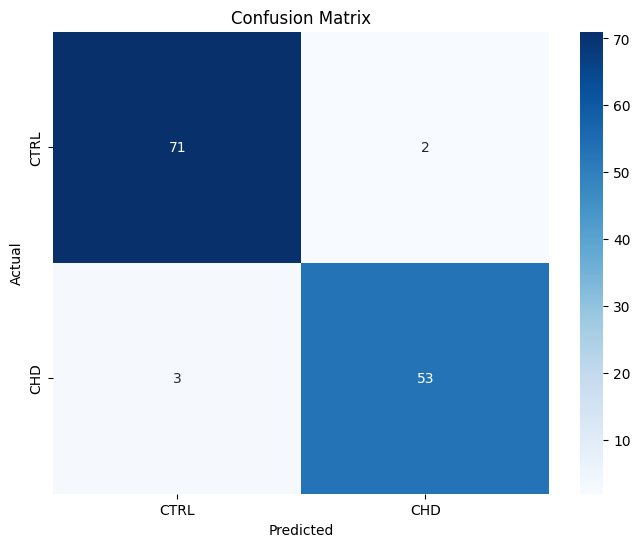

In [ ]:
from sklearn.model_selection import RepeatedKFold, cross_val_score
from sklearn.svm import LinearSVC

C_validation = [0.001, 0.005,0.006,0.007,0.008,0.009, 0.01,0.02,0.03,0.04, 0.05,0.06,0.07,0.08,0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

best_score = 0
best_c = None
value_validation = []

rkf = RepeatedKFold(n_splits=5, n_repeats=3,random_state=41100)

for c in C_validation:
    svm_classifier = LinearSVC(C=c)
    scores = cross_val_score(svm_classifier, X_train, y_train, cv=rkf, scoring='accuracy')
    mean_accuracy = np.mean(scores)
    value_validation.append(mean_accuracy)

    if mean_accuracy > best_score:
        best_score = mean_accuracy
        best_c = c

print("Best C:", best_c)
print("Best Score:", best_score)
print("Cross-Validation Mean Accuracy Scores:", value_validation)


best_svm_classifier = LinearSVC(C=best_c)
best_svm_classifier.fit(X_train, y_train)

y_pred = best_svm_classifier.predict(X_test)

test_accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", test_accuracy)
train_accuracy = accuracy_score(y_train, rf_classifier.predict(X_train))
print("Train Accuracy:", train_accuracy)
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=['CTRL', 'CHD'], yticklabels=['CTRL', 'CHD'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
# Calculate Test Sensitivity (Recall)
test_sensitivity = recall_score(y_test, y_pred)
print("Test Sensitivity:", test_sensitivity)

# Calculate Test Specificity
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
test_specificity = tn / (tn + fp)
print("Test Specificity:", test_specificity)

Test Sensitivity: 0.9464285714285714
Test Specificity: 0.9726027397260274


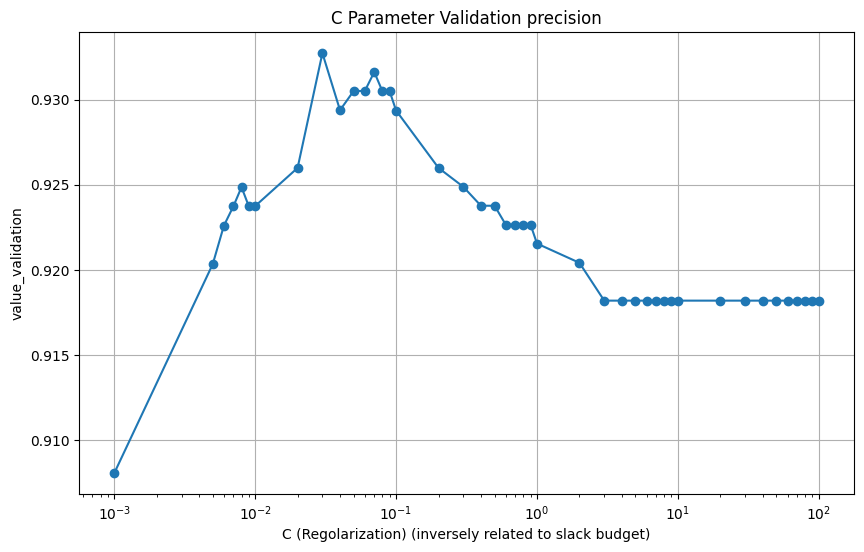

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(C_validation, value_validation, marker='o')
plt.xlabel("C (Regolarization) (inversely related to slack budget)")
plt.ylabel("value_validation")
plt.title("C Parameter Validation precision")
plt.xscale('log')
plt.grid(True)
plt.show()

##Logistic regressor test


The logistic regressor used for feature selection was reintroduced for testing.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import accuracy_score, recall_score

# Initialize the Logistic Regression model
logreg_classifier = LogisticRegression(penalty='elasticnet',solver='saga',max_iter=1000,l1_ratio=0.2)

logreg_classifier.fit(X_train, y_train)

y_pred = logreg_classifier.predict(X_test)

# Calculate and print evaluation metrics
test_accuracy = accuracy_score(y_test, y_pred)
test_sensitivity = recall_score(y_test, y_pred)
print("Test Accuracy:", test_accuracy)
print("Test sensitivity", test_sensitivity)

Test Accuracy: 0.9612403100775194
Test sensitivity 0.9464285714285714


In [ ]:
# Calculate Test Specificity
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
test_specificity = tn / (tn + fp)
print("Test Specificity:", test_specificity)

# Calculate Test Sensitivity (Recall)
test_sensitivity = recall_score(y_test, y_pred)
print("Test Sensitivity:", test_sensitivity)

Test Specificity: 0.9726027397260274
Test Sensitivity: 0.9464285714285714
